In [1]:
# import python packages -> pandas and seaborn
import pandas as pd
import seaborn as sns
from pandas.core.frame import DataFrame

In [283]:
# import matplot library and config view
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (20, 7)

In [284]:
import warnings
warnings.filterwarnings('ignore')

In [607]:
# import dataset and set index -> ResponseId column
url = 'dataset/survey_results_public.csv'
missing_values = [ "n.a." , "?" , "NA" , "n/a" , "na", "NaN" , "--"]
df_data = pd.read_csv(url, index_col='ResponseId', na_values= missing_values)

In [681]:
# make a copy of the dataset
df = df_data.copy()

In [522]:
# print the first n lines; where is n is the number of lines -> default = 5
df.head(2)

,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,TechDoc,...,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly,JobSat
ResponseId,,,,,,,,,,,,,,,,,,,,,
1,I am a developer by profession,Under 18 years old,"Employed, full-time",Remote,Apples,Hobby,Primary/elementary school,Books / Physical media,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,API document(s) and/or SDK document(s);User gu...,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN


In [682]:
# get the dimension of the dataset
shape = df.shape
print(f'The dataset has {shape[1]} columns and {shape[0]} rows')

The dataset has 113 columns and 65437 rows


In [440]:
# list of all columns
df.columns

Index(['MainBranch', 'Age', 'Employment', 'RemoteWork', 'Check',
       'CodingActivities', 'EdLevel', 'LearnCode', 'LearnCodeOnline',
       'TechDoc',
       ...
       'JobSatPoints_6', 'JobSatPoints_7', 'JobSatPoints_8', 'JobSatPoints_9',
       'JobSatPoints_10', 'JobSatPoints_11', 'SurveyLength', 'SurveyEase',
       'ConvertedCompYearly', 'JobSat'],
      dtype='object', length=113)

In [683]:
# Feature selection using domain knowledge
selected_cols = ['MainBranch', 'Age', 'Employment', 'RemoteWork', 'EdLevel', 'WorkExp', 'YearsCode', 'DevType', 'ICorPM', 'OrgSize', 'Country', 'Industry', 'ConvertedCompYearly','WebframeHaveWorkedWith','LanguageHaveWorkedWith', 'DatabaseHaveWorkedWith', 'PlatformHaveWorkedWith']
df = df[selected_cols]

In [611]:
# list of all columns
df.columns

Index(['MainBranch', 'Age', 'Employment', 'RemoteWork', 'EdLevel', 'WorkExp',
       'YearsCode', 'DevType', 'ICorPM', 'OrgSize', 'Country', 'Industry',
       'ConvertedCompYearly', 'WebframeHaveWorkedWith',
       'LanguageHaveWorkedWith', 'DatabaseHaveWorkedWith',
       'PlatformHaveWorkedWith'],
      dtype='object')

In [684]:
# get the dimension of the dataset
shape = df.shape
print(f'The dataset has {shape[1]} columns and {shape[0]} rows')

The dataset has 17 columns and 65437 rows


In [613]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 65437 entries, 1 to 65437
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   MainBranch              65437 non-null  object 
 1   Age                     65437 non-null  object 
 2   Employment              65437 non-null  object 
 3   RemoteWork              54806 non-null  object 
 4   EdLevel                 60784 non-null  object 
 5   WorkExp                 29658 non-null  float64
 6   YearsCode               59869 non-null  object 
 7   DevType                 59445 non-null  object 
 8   ICorPM                  29801 non-null  object 
 9   OrgSize                 47480 non-null  object 
 10  Country                 58930 non-null  object 
 11  Industry                28858 non-null  object 
 12  ConvertedCompYearly     23435 non-null  float64
 13  WebframeHaveWorkedWith  45161 non-null  object 
 14  LanguageHaveWorkedWith  59745 non-null  obj

In [614]:
df.describe()

,WorkExp,ConvertedCompYearly
count,29658.000000,2.343500e+04
mean,11.466957,8.615529e+04
std,9.168709,1.867570e+05
min,0.000000,1.000000e+00
25%,4.000000,3.271200e+04
50%,9.000000,6.500000e+04
75%,16.000000,1.079715e+05
max,50.000000,1.625660e+07


In [615]:
df.isnull().sum()

MainBranch                    0
Age                           0
Employment                    0
RemoteWork                10631
EdLevel                    4653
WorkExp                   35779
YearsCode                  5568
DevType                    5992
ICorPM                    35636
OrgSize                   17957
Country                    6507
Industry                  36579
ConvertedCompYearly       42002
WebframeHaveWorkedWith    20276
LanguageHaveWorkedWith     5692
DatabaseHaveWorkedWith    15183
PlatformHaveWorkedWith    23071
dtype: int64

### Functions

In [448]:
# Evaluating percentage of missing values
def evaluate_miss_values(df:DataFrame):
    result = dict()
    for col in df.columns:
        val = (df[col].isnull().sum()/len(df))*100
        result[col] = round(val)
    return result

# Pie chart plot function using ax
def plot_pie_chart(values: list, labels: list, title: str, colors=plt.cm.Paired.colors, ax=None):
    if ax is None:
        ax = plt.gca()
    ax.pie(values, labels=labels, 
           wedgeprops={'edgecolor': 'black', 'linewidth': 0.5}, 
           textprops={'fontsize': 11}, 
           colors=colors, 
           autopct='%1.2f%%')
    ax.set_title(title, fontsize=15, weight='bold', color='darkblue')

# Doughnut chart plot function using ax
def plot_doughnut_chart(values: list, labels: list, title: str, colors=sns.color_palette("muted"), ax=None):
    if ax is None:
        ax = plt.gca()
    ax.pie(values, labels=labels, 
           wedgeprops={'edgecolor': 'black', 'linewidth': 0.5, 'width': 0.3}, 
           textprops={'fontsize': 11}, 
           colors=colors, 
           startangle=90, 
           autopct='%1.2f%%')
    ax.set_title(title, fontsize=15, weight='bold', color='darkblue')

# Bar chart plot function using ax
def plot_bar_chart(x: list, y: list, title: str, ax=None):
    if ax is None:
        ax = plt.gca()
    ax.bar(x=x, height=y,
           color=plt.cm.Paired(range(len(x))), 
           edgecolor='black', 
           linewidth=0.8)
    ax.set_title(title, fontsize=15, weight='bold', color='darkblue')
    ax.set_xticklabels(x, rotation=60, fontsize=11)
    ax.grid(True, axis='y', linestyle='--', linewidth=0.7, alpha=0.7)
    for index, value in enumerate(y):
        ax.text(x=index, y=value + 0.02 * max(y), s=f'{str(round(value, 3))}', ha='center')

# Count plot function using ax
def plot_count_plot(data: DataFrame, x: str, title: str, hue=None, ax=None):
    if ax is None:
        ax = plt.gca()
    sns.countplot(data=data, x=x, hue=hue, palette='Set2', ax=ax)
    ax.set_title(title, fontsize=16, weight='bold', color='darkblue')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=11, color='#34495e')
    ax.grid(True, axis='y', linestyle='--', linewidth=0.7, alpha=0.7)
    for container in ax.containers:
        ax.bar_label(container)

# Line graph function
def plot_line_graph(x:list, y:list, color:str, title = None, xlab = None, ylab = None, ax=None):
    if ax is None:
        ax = plt.gca()
    ax.plot(x, y, color, linewidth=2, markersize=5);
    ax.grid(True, axis='y', linestyle='--', linewidth=0.7, alpha=0.7)
    ax.set_xlabel(xlab)
    ax.set_ylabel(ylab)
    ax.set_title(title, fontsize=16, weight='bold', color='darkblue');

# Check correlation
def correlations(df:DataFrame, col:str):
    corr_ = dict()
    cols:list = list(df.columns)
    cols.remove(col)

    for val in cols:
        corr = df[col].corr(df[val])
        corr_[val] = round(float(corr), 3)
    return corr_

# Understanding the dataset

<span style="color:yellow; font-size:30px;">Duplicated Rows or Entries, Missing Values and Outliers </span>

In [685]:
# create a new column -> duplicate
df['duplicates'] = df.duplicated(keep='last')
# Count duplicates and non-duplicates
duplicates_counts = df['duplicates'].value_counts()

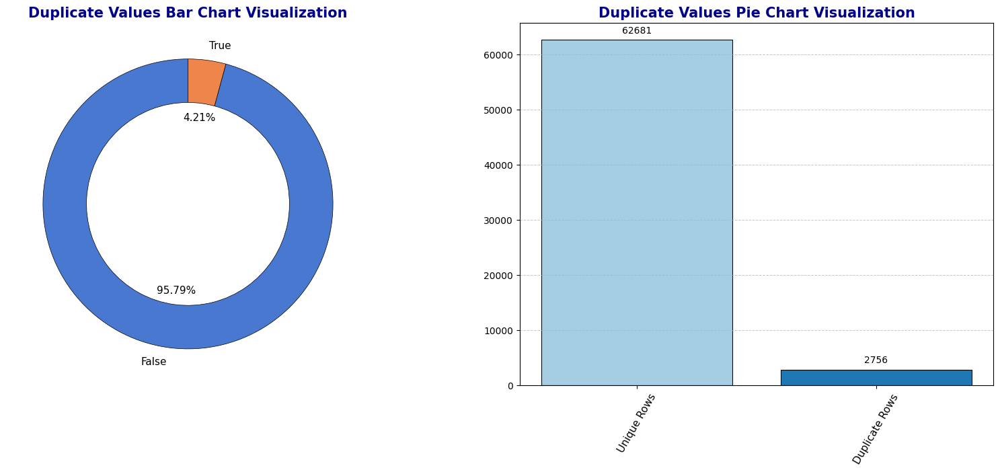

In [686]:
# plot duplicates and non-duplicates values count
fig, (ax1, ax2) = plt.subplots(1, 2)
plot_bar_chart(duplicates_counts.index, duplicates_counts.values, title='Duplicate Values Pie Chart Visualization', ax=ax2)
plt.xticks([0, 1], ['Unique Rows', 'Duplicate Rows']);

plot_doughnut_chart(labels=duplicates_counts.index, values=duplicates_counts.values, title='Duplicate Values Bar Chart Visualization', ax=ax1)

In [687]:
# drop all duplicates and drop the duplicate column
df = df.drop_duplicates(keep='last').drop(columns=['duplicates'])

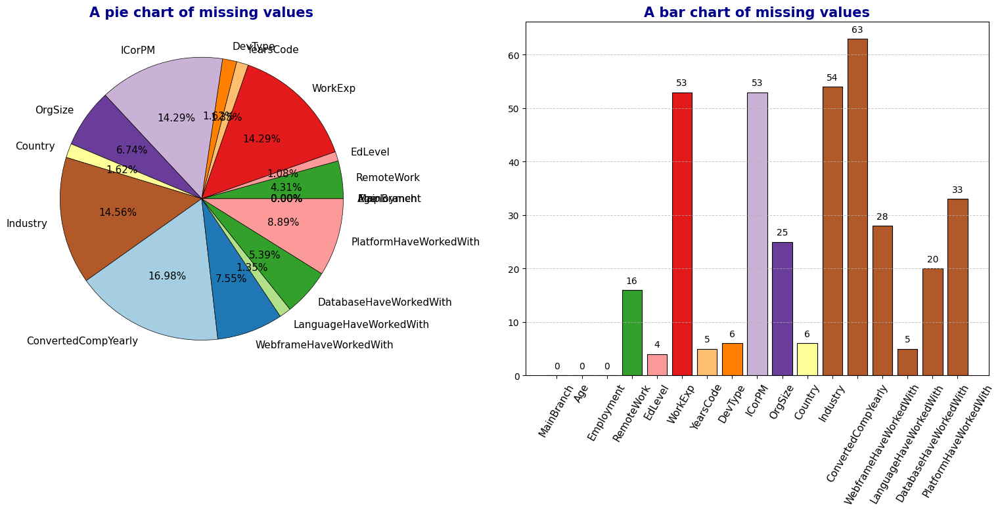

In [688]:
# ploting missing values
fig, (ax1, ax2) = plt.subplots(1, 2)
miss_values: dict = evaluate_miss_values(df)
x = miss_values.keys()
y = miss_values.values()
plot_pie_chart(y, x, title='A pie chart of missing values', ax=ax1)

# Bar chart distribution of missing values
plot_bar_chart(x, y, title='A bar chart of missing values', ax=ax2)

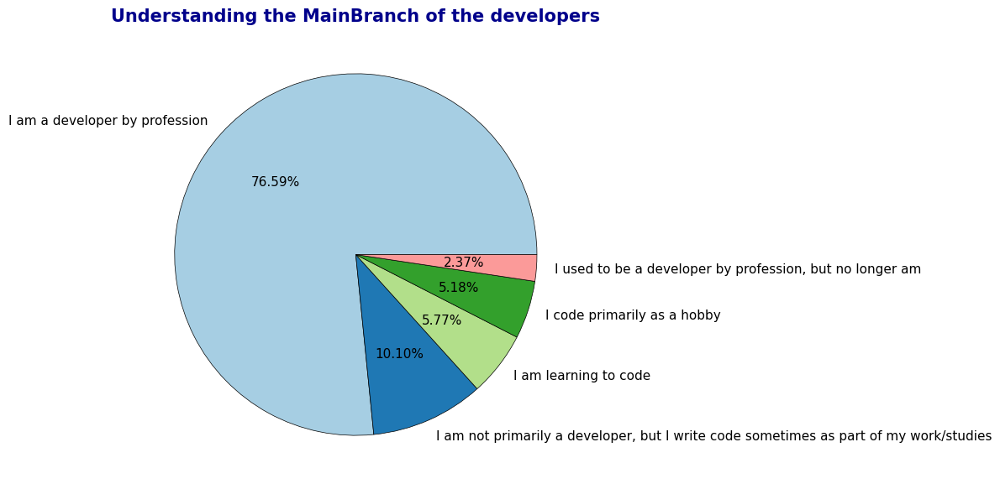

In [689]:
# Develpers distribution chart
dev_status_tag = df['MainBranch'].value_counts().index
dev_status_values = df['MainBranch'].value_counts().values

plot_pie_chart(dev_status_values, dev_status_tag, title='Understanding the MainBranch of the developers')

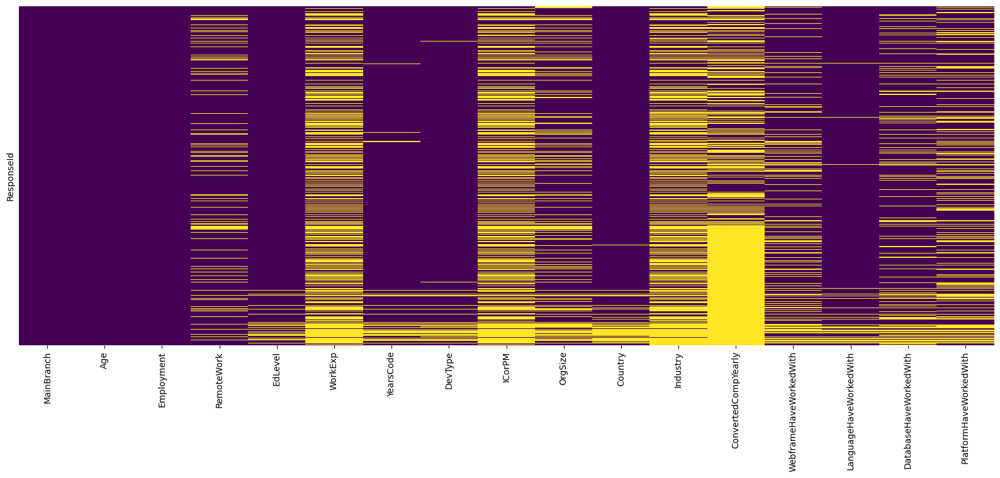

In [631]:
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis');

<span style="color:grey; font-size:20px;">Now let's handle missing values and formatting dataset</span>

In [690]:
# Checking the target column dimention
print(f'Columns with missing targrt: {df["ConvertedCompYearly"].isnull().sum()}') 
print(f'Columns with targrt:  {df["ConvertedCompYearly"].notnull().sum()}')

Columns with missing targrt: 39564
Columns with targrt:  23435


In [691]:
# Removing all rows missing values in the target column
labelled_df = df[df['ConvertedCompYearly'].notnull()].reset_index().drop(['ResponseId'], axis=1)
unlabelled_df = df[df['ConvertedCompYearly'].isnull()].reset_index().drop(['ResponseId'], axis=1)

In [692]:
# get the dimension of the new dataset
shape = labelled_df.shape
print(f'The dataset has {shape[1]} columns and {shape[0]} rows')  

The dataset has 17 columns and 23435 rows


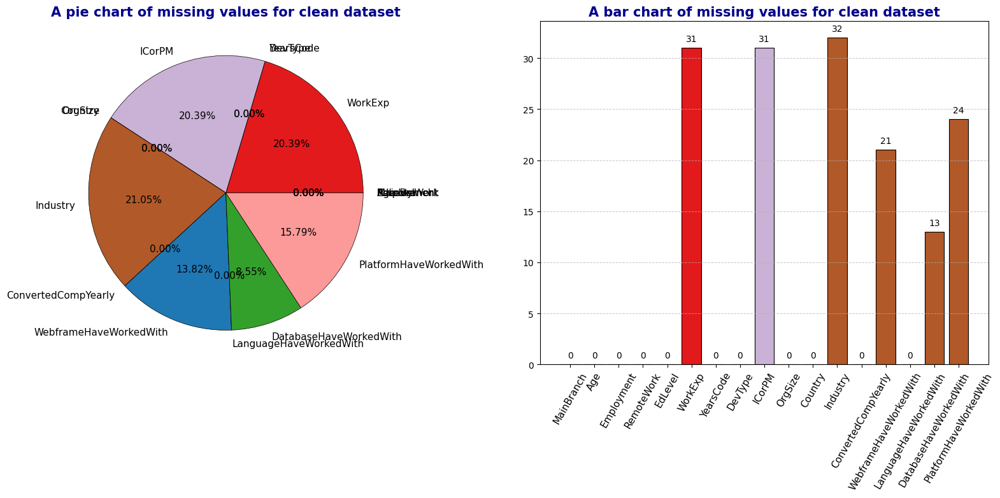

In [693]:
# ploting missing values distribution on the new df
fig, (ax1, ax2) = plt.subplots(1, 2)
new_df_miss_val: dict = evaluate_miss_values(labelled_df)
x2 = new_df_miss_val.keys()
y2 = new_df_miss_val.values()
plot_pie_chart(y2, x2, title='A pie chart of missing values for clean dataset', ax=ax1)

# Bar chart distribution of missing values
plot_bar_chart(x2, y2, title='A bar chart of missing values for clean dataset', ax=ax2)

In [694]:
# convert -> LanguageHaveWorkedWith, WebframeHaveWorkedWith, DatabaseHaveWorkedWith, PlatformHaveWorkedWith -> list
skills_cols = ['LanguageHaveWorkedWith', 'WebframeHaveWorkedWith','DatabaseHaveWorkedWith', 'PlatformHaveWorkedWith']
# fill all missing values in skills cols with the mode and format data to list
for col in skills_cols:
    lang_mode = labelled_df[col].mode()[0]
    labelled_df[col] = labelled_df[col].fillna(lang_mode)
    labelled_df[col].isnull().sum()
    labelled_df[col] = labelled_df[col].apply(lambda a: str(a).split(';'))

In [695]:
# convert skills list to frequency
# let us assign weight to each language base on it popularity
from itertools import chain

for col in skills_cols:
    pop = dict()
    # for skill in chain.from_iterable(labelled_df[col]):
    #     pop[skill] = pop.get(skill, 0) + 1

    # labelled_df[col] = labelled_df[col].apply(lambda a: sum(pop[skill] for skill in a))
    # labelled_df[col].astype(int)

    labelled_df[col] = labelled_df[col].apply(lambda a: len(a))
    labelled_df[col].astype(int)

In [696]:
# Handling -> 'RemoteWork', 'OrgSize', 'DevType', 'PurchaseInfluence'
missValColumns = ['RemoteWork', 'OrgSize', 'DevType', 'Industry', 'WorkExp', 'ICorPM']
for col in missValColumns:
    colMode = labelled_df[col].mode()[0]
    labelled_df[col] = labelled_df[col].fillna(colMode)

labelled_df.isnull().sum()

MainBranch                 0
Age                        0
Employment                 0
RemoteWork                 0
EdLevel                    0
WorkExp                    0
YearsCode                 47
DevType                    0
ICorPM                     0
OrgSize                    0
Country                    0
Industry                   0
ConvertedCompYearly        0
WebframeHaveWorkedWith     0
LanguageHaveWorkedWith     0
DatabaseHaveWorkedWith     0
PlatformHaveWorkedWith     0
dtype: int64

In [697]:
labelled_df['WorkExp'].astype(int).unique()

array([ 3,  7,  8, 18, 30, 16, 17,  1,  4, 15, 25, 20, 10, 11, 28, 24, 12,
       23,  9, 40, 14, 27, 26,  0, 19, 22, 13, 44, 41,  2,  5,  6, 31, 36,
       29, 45, 39, 38, 35, 21, 34, 50, 32, 37, 33, 42, 46, 43, 49, 48, 47])

In [543]:
# Group workexp into junior, mid and senior level class

# labelled_df['WorkExp'] = labelled_df['WorkExp'].apply( 
#     lambda a: 'junior' if a < 5 else ('mid' if 5 <= a < 10 else 'senior'))

In [698]:
# print all uniques entries in yearcode
labelled_df['YearsCode'].unique()

array(['3', '12', '15', '27', '7', '32', '38', '23', '50', '30', '21',
       '10', '6', '40', '20', '9', '25', '14', '11', '28', '16', '18',
       '37', '47', '1', '17', '36', '19', '24', '2', '5', '34', '48',
       '46', '26', '13', '33', '31', '45', '22', '41', '35', '4', '8',
       '44', '29', '42', 'More than 50 years', '39', '43',
       'Less than 1 year', nan, '49'], dtype=object)

In [699]:
# Handle year code missing values, formate data and covert to int()
labelled_df['YearsCode'] = labelled_df['YearsCode'].fillna(labelled_df['YearsCode'].mode()[0])
labelled_df['YearsCode'] = labelled_df['YearsCode'].replace(['More than 50 years', 'Less than 1 year'], [50, 0])
labelled_df['YearsCode']= labelled_df['YearsCode'].astype(int)

In [700]:
labelled_df['YearsCode'].unique()

array([ 3, 12, 15, 27,  7, 32, 38, 23, 50, 30, 21, 10,  6, 40, 20,  9, 25,
       14, 11, 28, 16, 18, 37, 47,  1, 17, 36, 19, 24,  2,  5, 34, 48, 46,
       26, 13, 33, 31, 45, 22, 41, 35,  4,  8, 44, 29, 42, 39, 43,  0, 49])

In [701]:
labelled_df.isnull().sum()

MainBranch                0
Age                       0
Employment                0
RemoteWork                0
EdLevel                   0
WorkExp                   0
YearsCode                 0
DevType                   0
ICorPM                    0
OrgSize                   0
Country                   0
Industry                  0
ConvertedCompYearly       0
WebframeHaveWorkedWith    0
LanguageHaveWorkedWith    0
DatabaseHaveWorkedWith    0
PlatformHaveWorkedWith    0
dtype: int64

<span style="color:yellow; font-size:25px;">Clasify salary as high pay or low pay </span>

In [702]:
# clasify salary as high pay or low pay
labelled_df['compensationClass'] = labelled_df['ConvertedCompYearly'].apply(lambda a: 0 if a < 55000 else 1)

<span style="color:yellow; font-size:20px;">Univariate Analysis</span>

<Axes: ylabel='Age'>

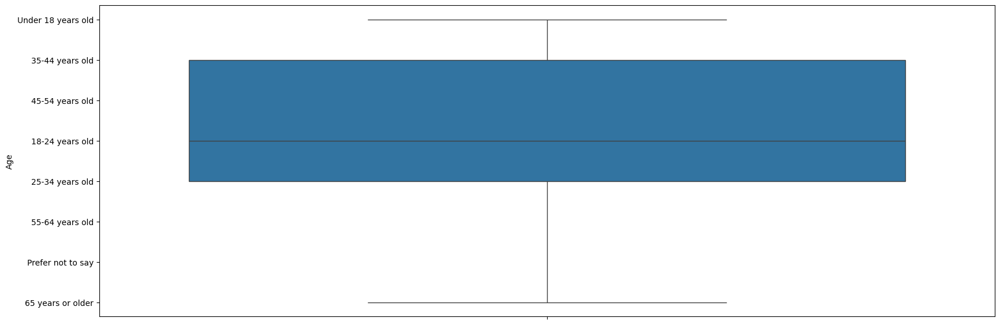

In [703]:
sns.boxplot(data=df['Age'])

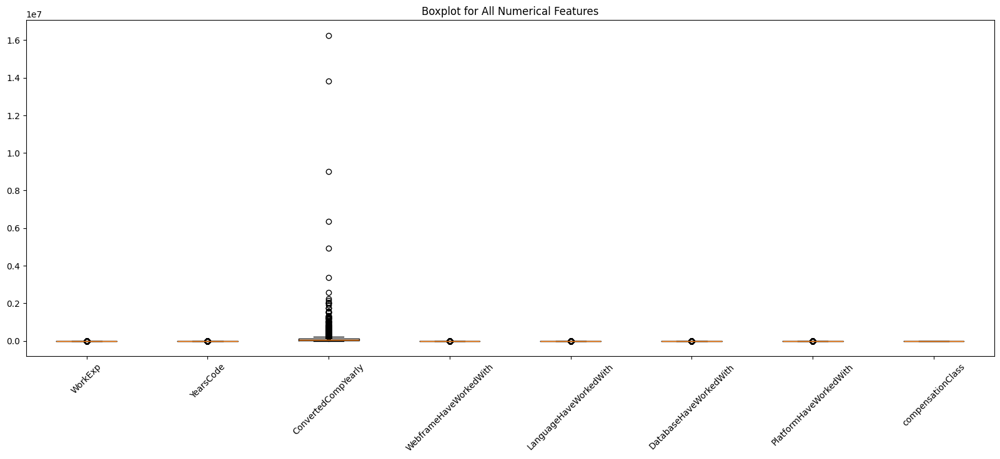

In [646]:
# Select numerical columns
numerical_columns = labelled_df.select_dtypes(include=['float64', 'int64']).columns

plt.boxplot([labelled_df[col] for col in numerical_columns], labels=numerical_columns)

# Add a title and labels
plt.title('Boxplot for All Numerical Features')
plt.xticks(rotation=45);

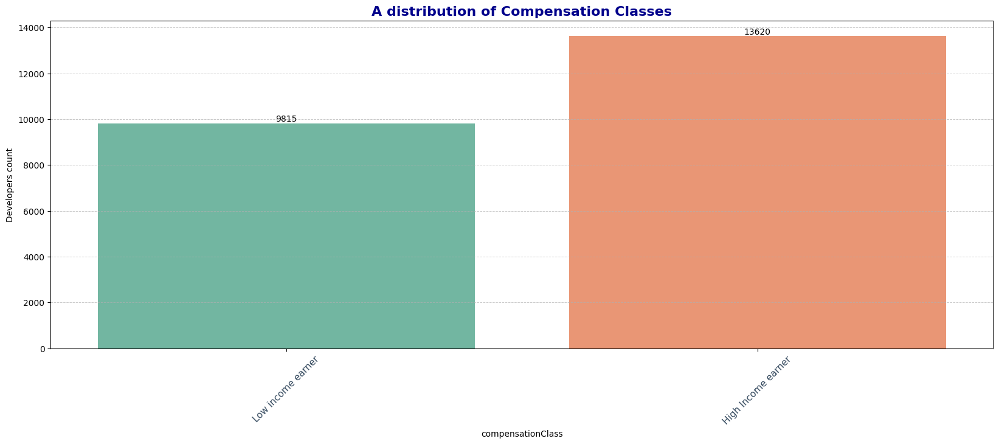

In [647]:
# A dictribution of compensation class into low and high income earners
plot_count_plot(labelled_df, 'compensationClass', 'A distribution of Compensation Classes')
plt.xticks([0, 1], ['Low income earner', 'High Income earner']);
plt.ylabel(ylabel='Developers count');

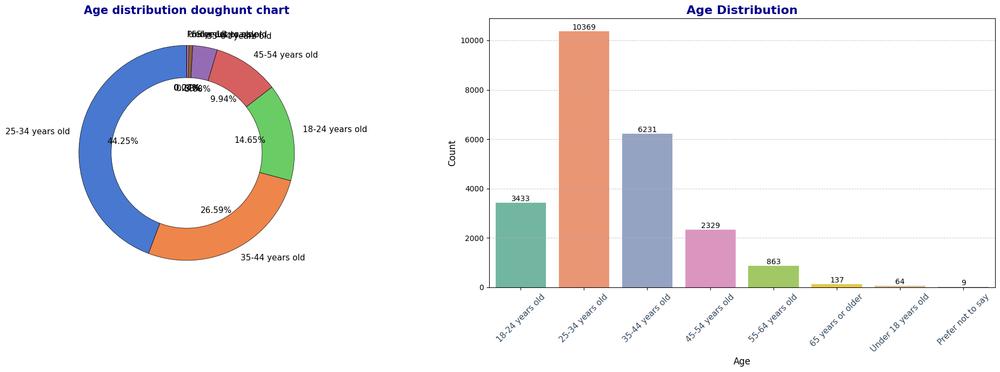

In [648]:
fig, (ax1, ax2) = plt.subplots(1, 2)

plot_count_plot(labelled_df, 'Age', 'Age Distribution', ax=ax2);
plt.xlabel('Age', fontsize=12);
plt.ylabel('Count', fontsize=12);

values = labelled_df['Age'].value_counts()
labels = values.index
plot_doughnut_chart(values, labels,"Age distribution doughunt chart",  ax=ax1);
plt.tight_layout()

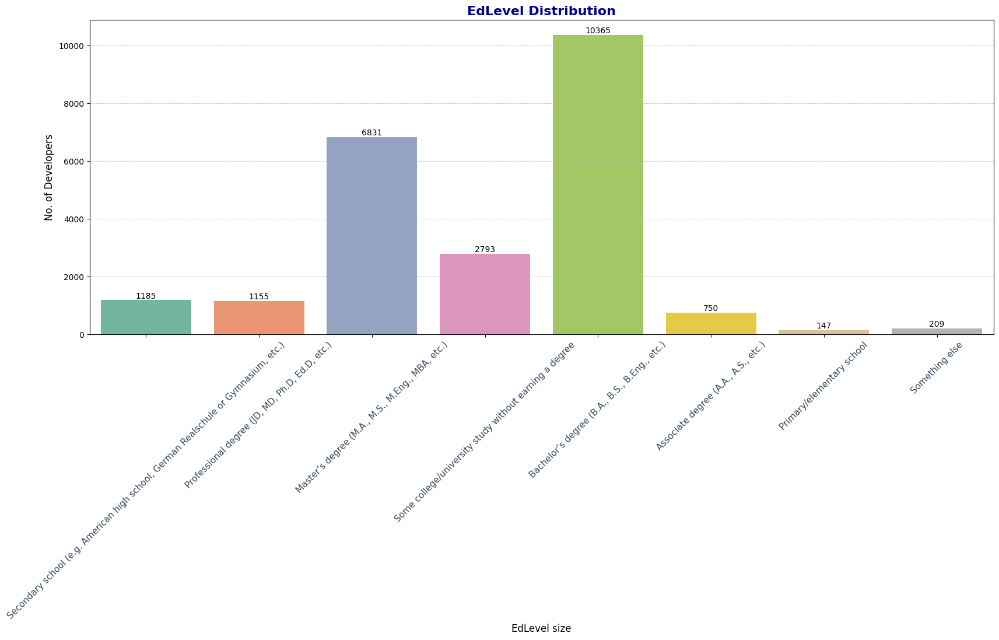

In [649]:
# Educational level distribution
plot_count_plot(labelled_df, 'EdLevel', 'EdLevel Distribution')
plt.xlabel('EdLevel size', fontsize=12)
plt.ylabel('No. of Developers', fontsize=12);

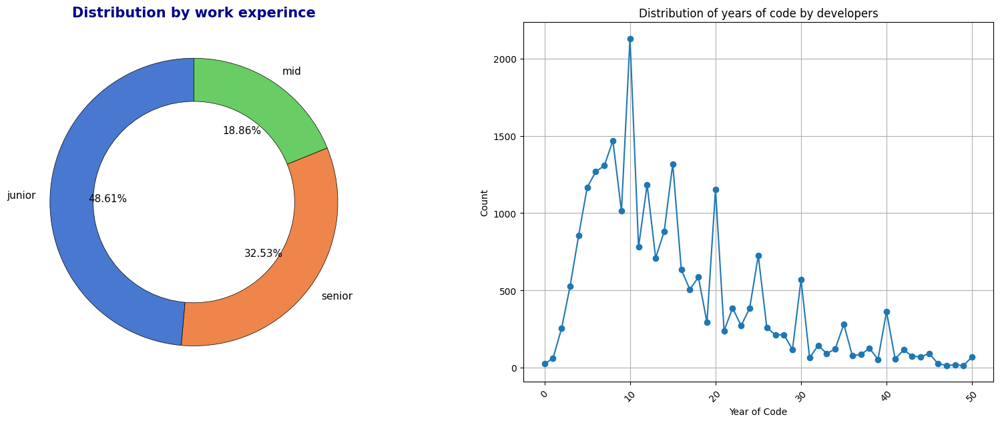

In [651]:
fig, (ax1, ax2) = plt.subplots(1, 2)
# Distribution of years of code by developers
duration_value = labelled_df.groupby('YearsCode')['YearsCode'].value_counts()

duration_value.plot(kind='line', marker='o', ax=ax2)
plt.title('Distribution of years of code by developers')
plt.xlabel('Year of Code')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(True)

# Chart of work experince of developer grouped into junior, mid and senior level
values = labelled_df['WorkExp'].apply( 
    lambda a: 'junior' if a < 5 else ('mid' if 5 <= a < 10 else 'senior')).value_counts()

labels = values.index

plot_doughnut_chart(values, labels,"Distribution by work experince", ax=ax1)

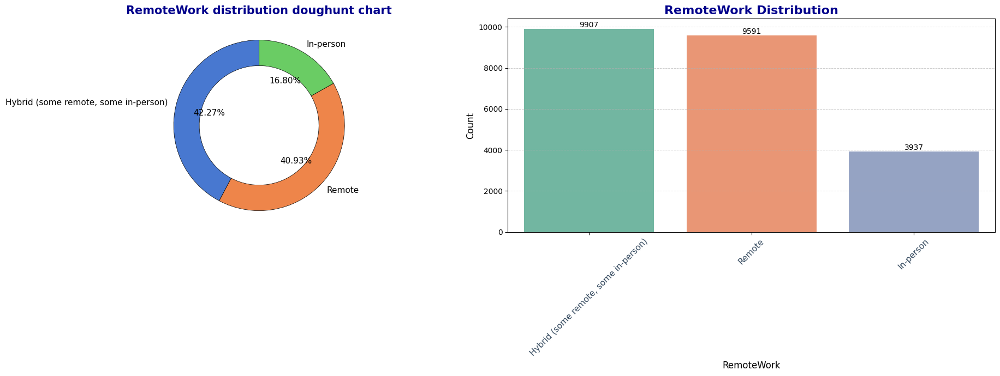

In [652]:
fig, (ax1, ax2) = plt.subplots(1, 2)

plot_count_plot(labelled_df, 'RemoteWork', 'RemoteWork Distribution', ax=ax2);
plt.xlabel('RemoteWork', fontsize=12);
plt.ylabel('Count', fontsize=12);

values = labelled_df['RemoteWork'].value_counts()
labels = values.index
plot_doughnut_chart(values, labels,"RemoteWork distribution doughunt chart",  ax=ax1);
plt.tight_layout()

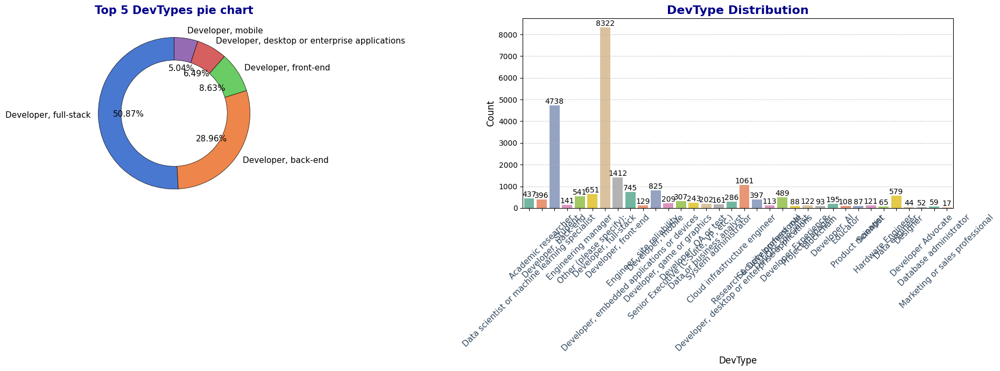

In [653]:
fig, (ax1, ax2) = plt.subplots(1, 2)

plot_count_plot(labelled_df, 'DevType', 'DevType Distribution', ax=ax2);
plt.xlabel('DevType', fontsize=12);
plt.ylabel('Count', fontsize=12);

values = labelled_df['DevType'].value_counts()
labels = values.index
plot_doughnut_chart(values[:5], labels[:5],"Top 5 DevTypes pie chart",  ax=ax1);
plt.tight_layout()

<span style="color:yellow; font-size:20px;">Bivariate & Multivariate Analysis</span>

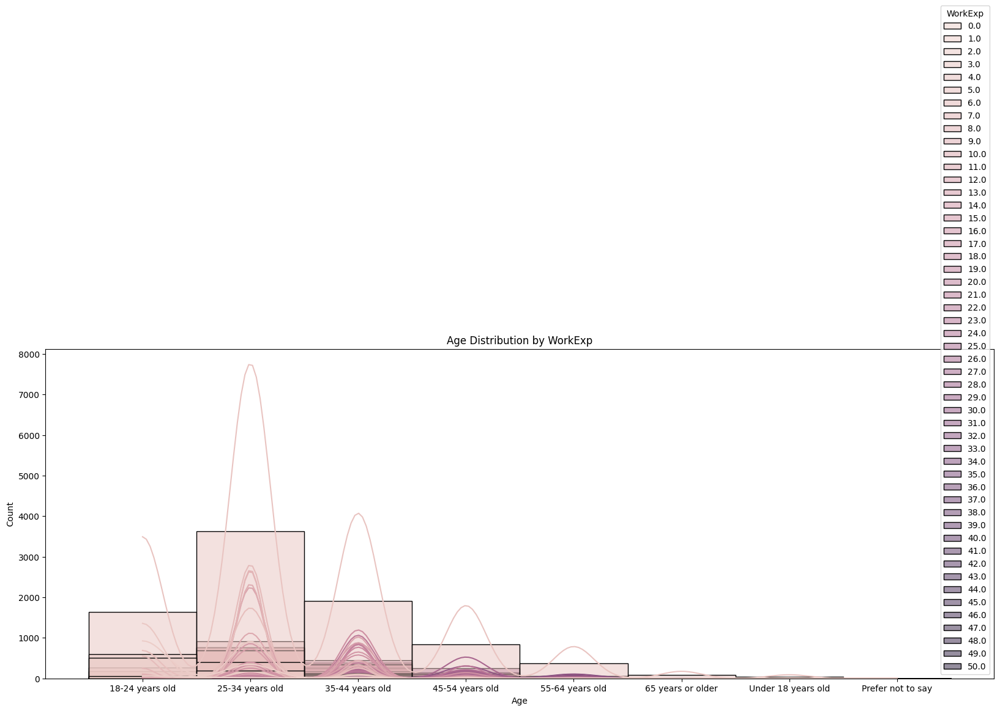

In [654]:
# Analyze the distribution of ages across different WorkExp.
sns.histplot(data=labelled_df, x='Age', hue='WorkExp', kde=True, bins=20)
plt.title('Age Distribution by WorkExp')
plt.show()

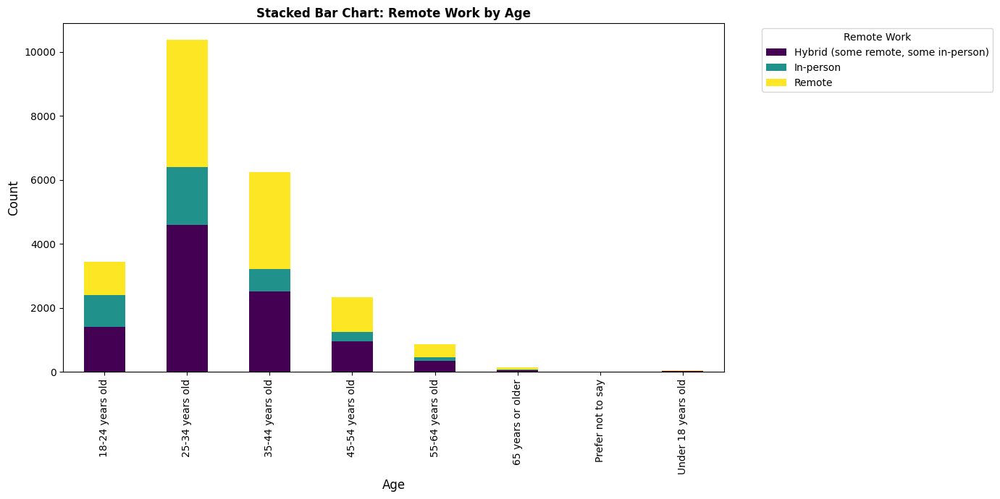

In [655]:
ratings = labelled_df.groupby(['Employment', 'RemoteWork', 'Age']).size().reset_index().rename(columns={0:'count'})

stacked_data = ratings.pivot_table(index='Age', columns='RemoteWork', values='count', aggfunc='sum', fill_value=0)

stacked_data.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='viridis')
plt.title('Stacked Bar Chart: Remote Work by Age', fontsize=12, weight='bold')
plt.xlabel('Age', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.legend(title='Remote Work', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

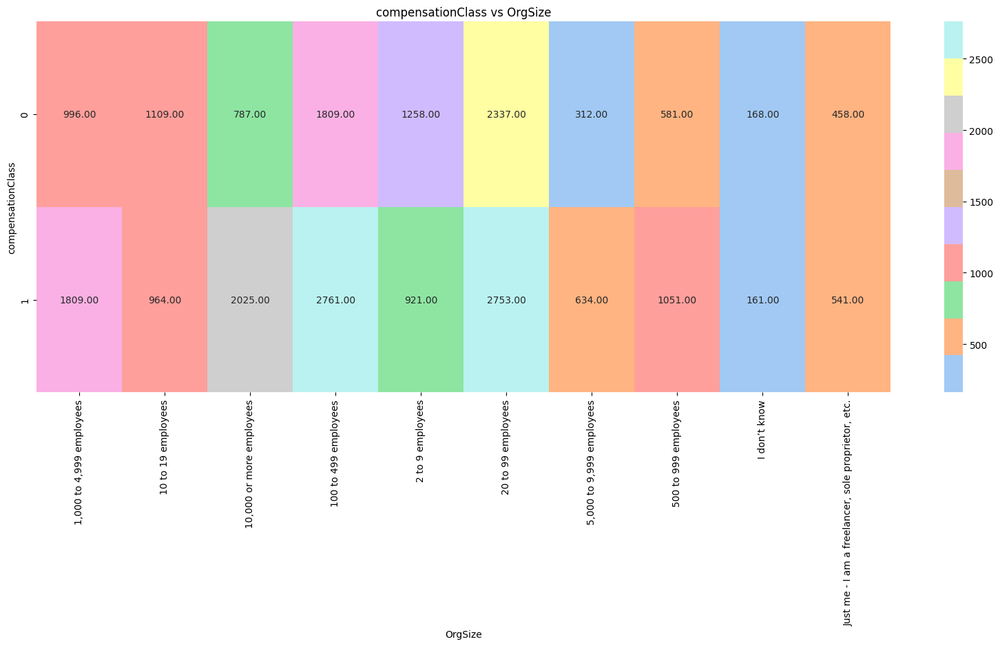

In [656]:
family_treatment = labelled_df.groupby(['compensationClass', 'OrgSize']).size().unstack()
sns.heatmap(family_treatment, annot=True, fmt='.2f', cmap=sns.color_palette('pastel'))
plt.title('compensationClass vs OrgSize');

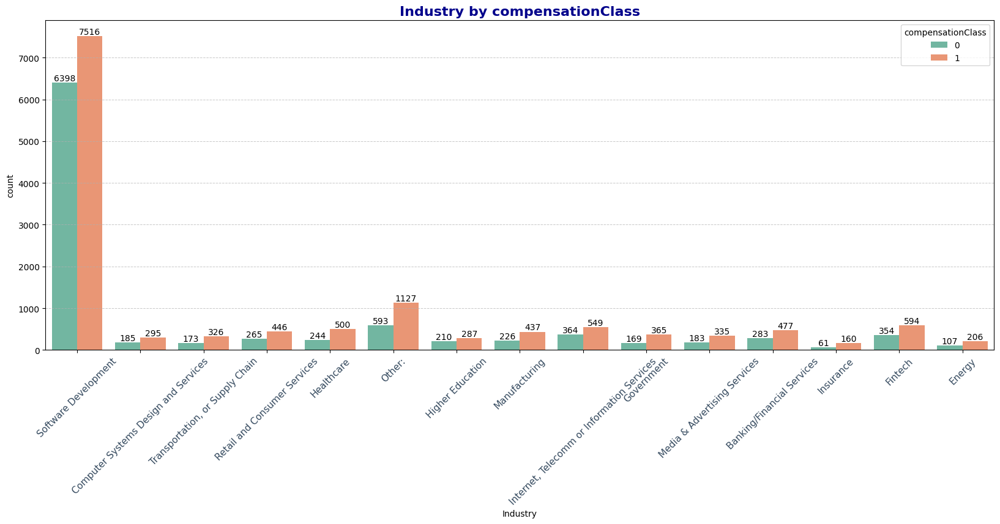

In [657]:
# Industry indistribution by compensationClass
plot_count_plot(data=labelled_df, x='Industry', hue='compensationClass', title='Industry by compensationClass')

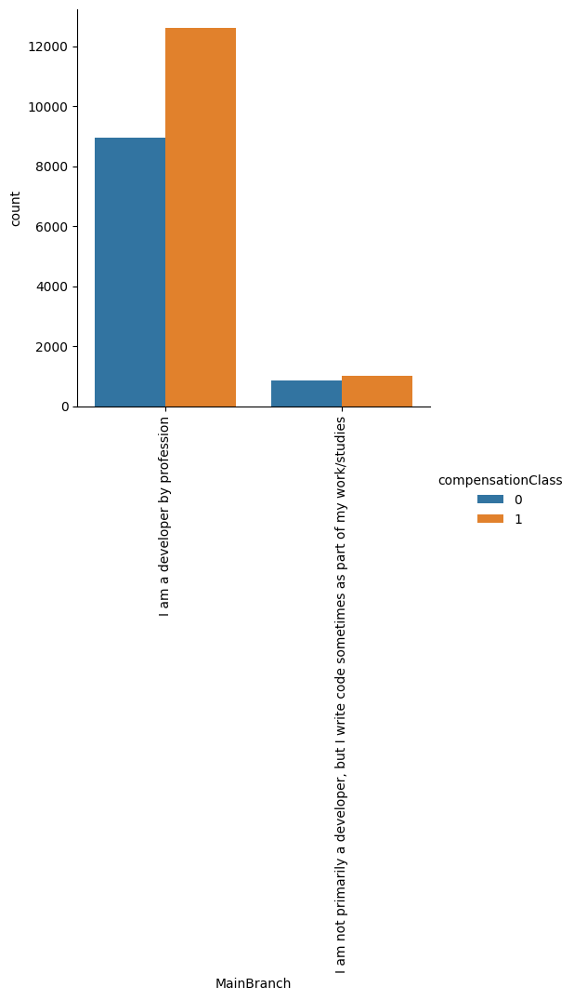

In [658]:
sns.catplot(data=labelled_df, kind='count', x='MainBranch', hue='compensationClass');
plt.xticks(rotation=90, fontsize=10);

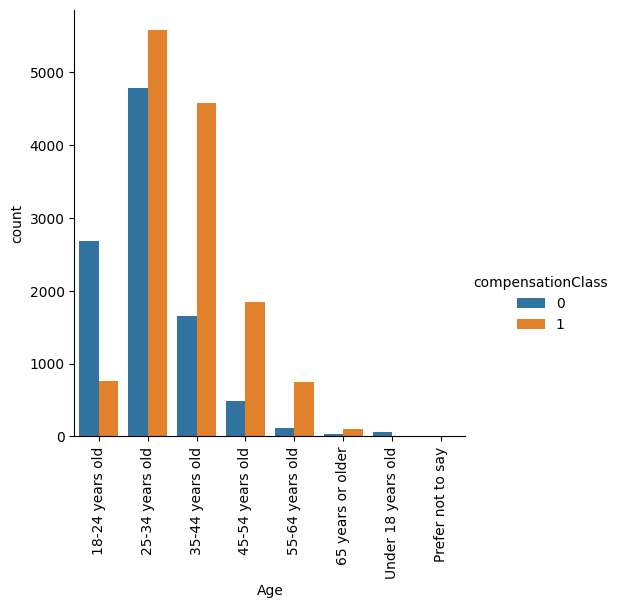

In [659]:
sns.catplot(data=labelled_df, kind='count', x='Age', hue='compensationClass');
plt.xticks(rotation=90, fontsize=10);

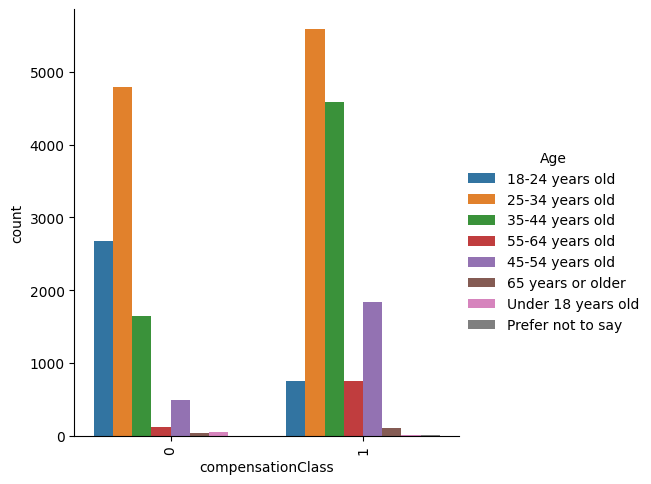

In [660]:
sns.catplot(data=labelled_df, kind='count', x='compensationClass', hue='Age');
plt.xticks(rotation=90, fontsize=10);


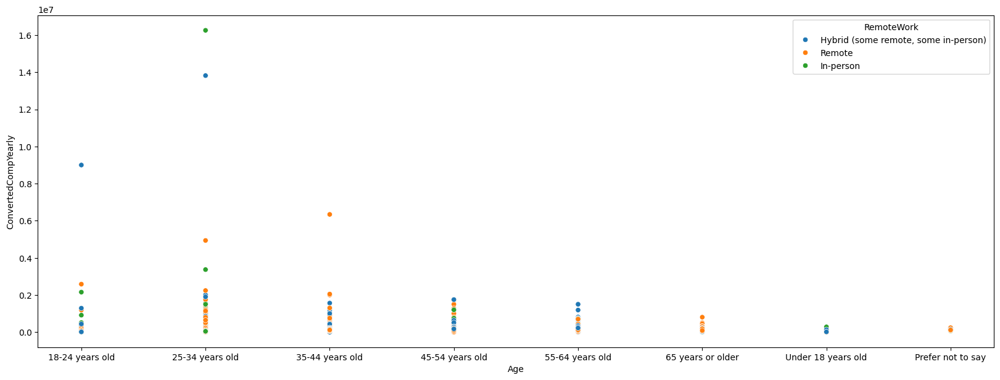

In [661]:
sns.scatterplot(data = labelled_df, y = 'ConvertedCompYearly', x = 'Age', hue = 'RemoteWork');

### Encoding all categorical columns

In [704]:
# LabelEncode categorical columns
from sklearn.preprocessing import LabelEncoder
encode = LabelEncoder()

balelEncodeColumns = labelled_df.select_dtypes(include=['object']).columns.tolist()
# endcode all categorical columns except -> 'Age', 'OrgSize'
balelEncodeColumns = [col for col in balelEncodeColumns if col not in ['Age', 'OrgSize'] ]

for col in balelEncodeColumns:
    labelled_df[col] = encode.fit_transform(labelled_df[col])

# for col in strColumns:
#     unique = {v:k for k,v in enumerate(new_df[col].unique())}
#     new_df[col].map(unique)

In [705]:
# Ordinal Encoding age and orgsize
age_group = {
    'Under 18 years old': 0,
    '18-24 years old': 1,
    '25-34 years old': 2,
    '35-44 years old': 3,
    '45-54 years old': 4,
    '55-64 years old': 5,
    '65 years or older': 6,
    'Prefer not to say': -1
}

orgSize_group = {
    'Just me - I am a freelancer, sole proprietor, etc.': 0,
    '2 to 9 employees': 1,
    '10 to 19 employees': 2,
    '20 to 99 employees': 3,
    '100 to 499 employees': 4,
    '500 to 999 employees': 5,
    '1,000 to 4,999 employees': 6,
    '5,000 to 9,999 employees': 7,
    '10,000 or more employees': 8,
    'I don’t know': 9
}

labelled_df['Age'] = labelled_df['Age'].map(age_group)
labelled_df['OrgSize'] = labelled_df['OrgSize'].map(orgSize_group)

In [706]:
labelled_df.head()

,MainBranch,Age,Employment,RemoteWork,EdLevel,WorkExp,YearsCode,DevType,ICorPM,OrgSize,Country,Industry,ConvertedCompYearly,WebframeHaveWorkedWith,LanguageHaveWorkedWith,DatabaseHaveWorkedWith,PlatformHaveWorkedWith,compensationClass
0,0,1,18,0,5,3.0,3,5,1,4,112,13,7322.0,7,11,3,2,0
1,1,2,0,0,4,3.0,12,0,0,4,9,13,30074.0,1,6,1,1,0
2,0,3,0,2,2,7.0,15,5,0,3,151,1,91295.0,3,5,3,6,1
3,0,3,28,2,2,3.0,27,13,0,0,52,13,53703.0,1,1,4,2,0
4,0,2,24,2,6,8.0,7,32,0,2,158,14,110000.0,4,5,3,1,1


### Checking correlations

In [707]:
corr = correlations(labelled_df, 'ConvertedCompYearly')
corr

{'MainBranch': -0.01,
 'Age': 0.123,
 'Employment': -0.041,
 'RemoteWork': 0.028,
 'EdLevel': -0.015,
 'WorkExp': 0.104,
 'YearsCode': 0.14,
 'DevType': 0.029,
 'ICorPM': 0.034,
 'OrgSize': 0.071,
 'Country': 0.105,
 'Industry': -0.026,
 'WebframeHaveWorkedWith': -0.037,
 'LanguageHaveWorkedWith': 0.008,
 'DatabaseHaveWorkedWith': -0.007,
 'PlatformHaveWorkedWith': 0.018,
 'compensationClass': 0.271}

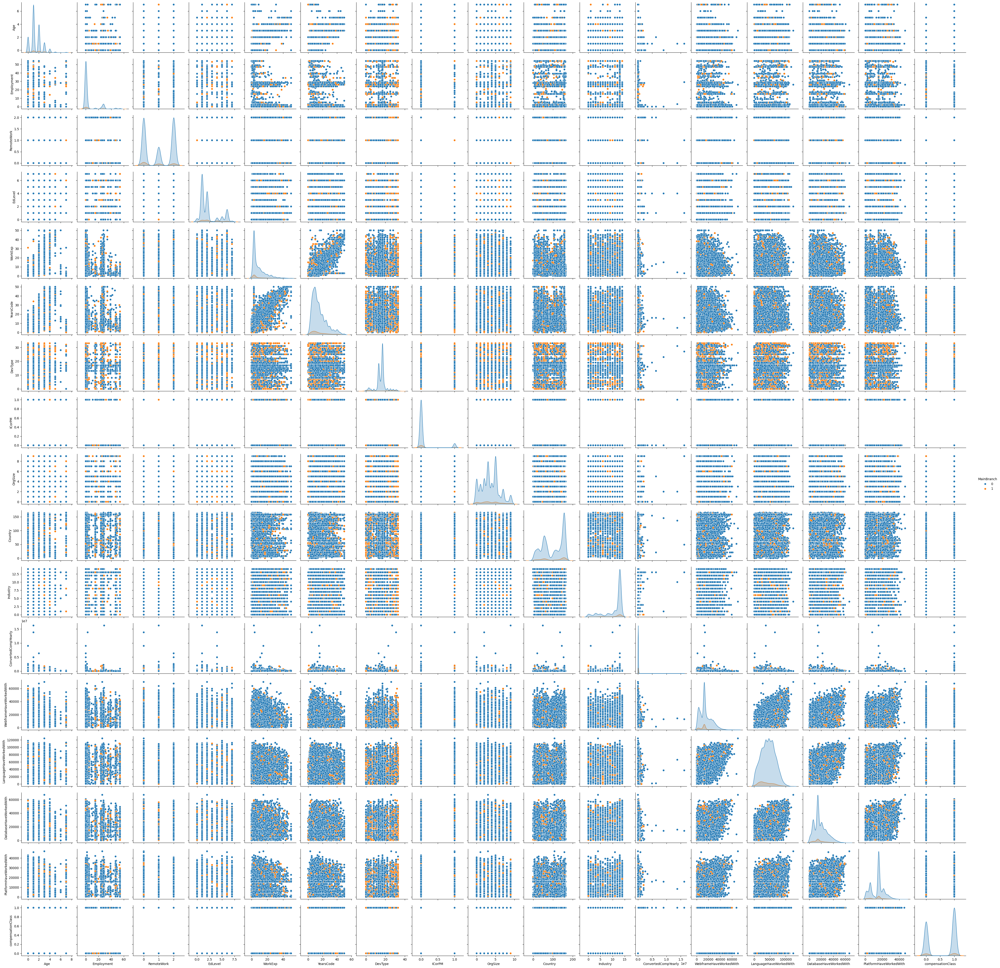

In [42]:
sns.pairplot(labelled_df, hue='MainBranch')

### Split dataset into features (input variables) and target (output variable), then into training, validation and test sets, followed by normalizing the data

In [708]:
# split dataset into test,main train and validation train dataset at a normalization using minmaxscaler
def preprocess_data(x, y, classificaion=True):
    from sklearn.model_selection import train_test_split
    from sklearn.preprocessing import MinMaxScaler
    # init MinMax
    scale = MinMaxScaler()

    if classificaion:
        # split dataset
        x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state = 10)
        x_train_main, x_val, y_train_main, y_val = train_test_split(x_train, y_train, test_size=0.1, random_state = 10)

        # Fit scaler on the entire training data
        scale = scale.fit(x_train_main)
        x_train_main = scale.transform(x_train_main)
        x_val = scale.transform(x_val)
        
        x_test = scale.transform(x_test)

        return x_train_main, x_test, x_val, y_train_main, y_val, y_test
    
    else:
        # split dataset
        x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state = 10)

        # Fit scaler on the entire training data
        scale = scale.fit(x_train)
        x_train = scale.transform(x_train)

        return x_train, x_test, y_train, y_test

In [749]:
# Split feature from target variable
xFeature = labelled_df.drop(['ConvertedCompYearly', 'compensationClass'], axis=1)

yTarget_reg = labelled_df['ConvertedCompYearly'] # Regression
yTarget_cls = labelled_df['compensationClass'] # Classification

In [750]:
# split dataset into test,main train and validation train dataset
x_train_main, x_test, x_val, y_train_main, y_val, y_test = preprocess_data(xFeature.copy(), yTarget_cls.copy())

In [751]:
x_train_main.shape, y_train_main.shape

((14763, 16), (14763,))

#### Baseline Model: Logistic regression

In [713]:
# lets build a baseline model
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,f1_score

def train_baseline_model(x_train, y_train, x_val, y_val):
    lgg = LogisticRegression()
    
    # Fit the model on the training data
    lgg.fit(x_train, y_train)
    
    # Make predictions
    pred_train = lgg.predict(x_train)
    pred_val = lgg.predict(x_val)
    
    # Calculate F1 scores
    train_f1 = round(f1_score(y_train, pred_train), 3)
    val_f1 = round(f1_score(y_val, pred_val), 3)
    
    return {"train": train_f1, "validation": val_f1}

In [752]:
baseline_model = train_baseline_model(x_train_main, y_train_main, x_val, y_val)
baseline_model

{'train': np.float64(0.767), 'validation': np.float64(0.761)}

### Feature selection

<span style="color:yellow; font-size:20px;">Using variance for feature selection</span>

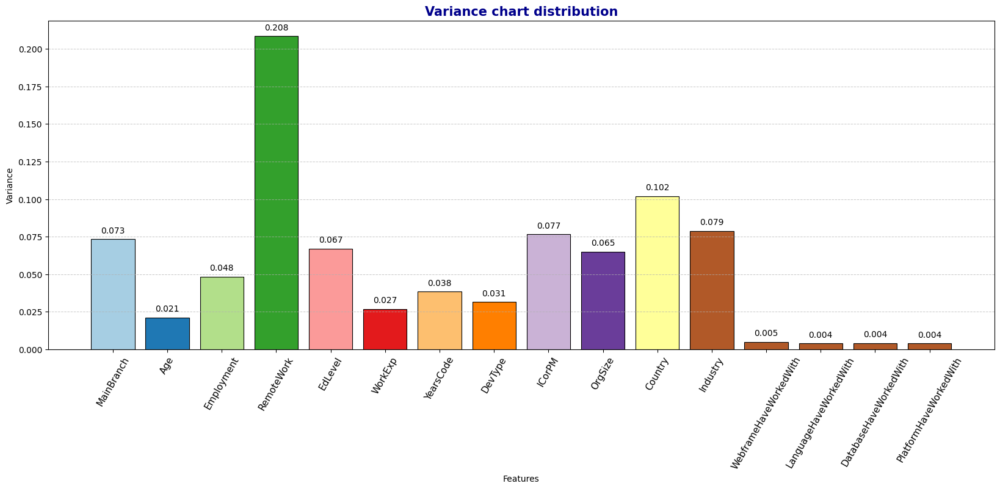

In [753]:
# Find variance and plot the variance for each column
variance = x_train_main.var(axis=0) # y
columns = xFeature.columns

plot_bar_chart(x = columns, y=variance, title='Variance chart distribution')
plt.xlabel('Features')
plt.ylabel('Variance');

<span style="color:yellow; font-size:17px;">Drop columns with variance less than 0.004%</span>

In [754]:
# make a copy of xFeatures and drop columns
xFeature_copy1 = xFeature.drop(columns=['LanguageHaveWorkedWith', 'DatabaseHaveWorkedWith', 'PlatformHaveWorkedWith'], axis=1)

# prepare data for training
x_train_main, x_test, x_val, y_train_main, y_val,y_test = preprocess_data(xFeature_copy1, yTarget_cls.copy())

len(x_train_main[0]), len(x_test[0])

(13, 13)

In [755]:
# train a model
var_model = train_baseline_model(x_train_main, y_train_main, x_val, y_val)
var_model

{'train': np.float64(0.765), 'validation': np.float64(0.764)}

In [756]:
# the model performs better with the two columns - > 'Age', 'WebframeHaveWorkedWith'
# Low variance doesn't always mean low importance.

baseline_model['train'] - var_model['train'] , baseline_model['validation'] - var_model['validation']

(np.float64(0.0020000000000000018), np.float64(-0.0030000000000000027))

<span style="color:yellow; font-size:20px;">Random Forest for Feature Selection</span>

###### Random Forest will help you identify the most important features based on how well each feature contributes to the model’s accuracy

In [757]:
# prepare data for training
x_train_main, x_test, x_val, y_train_main, y_val, y_test = preprocess_data(xFeature.copy(), yTarget_cls.copy())

len(x_train_main[0]), len(x_test[0])

(16, 16)

In [758]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier()

rfc.fit(x_train_main, y_train_main)
importance = rfc.feature_importances_

# Display feature importances
for i, val in enumerate(importance):
    print(f'{xFeature.columns[i]} ->\t {val:.3f}')

MainBranch ->	 0.008
Age ->	 0.067
Employment ->	 0.037
RemoteWork ->	 0.025
EdLevel ->	 0.038
WorkExp ->	 0.080
YearsCode ->	 0.144
DevType ->	 0.059
ICorPM ->	 0.006
OrgSize ->	 0.058
Country ->	 0.258
Industry ->	 0.037
WebframeHaveWorkedWith ->	 0.044
LanguageHaveWorkedWith ->	 0.058
DatabaseHaveWorkedWith ->	 0.046
PlatformHaveWorkedWith ->	 0.033


In [759]:
# drop columns with importance lower than 0.009
xFeature = xFeature.drop(['ICorPM', 'MainBranch'], axis=1)
# prepare data for training
x_train_main, x_test, x_val, y_train_main, y_val, y_test = preprocess_data(xFeature.copy(), yTarget_cls.copy())

In [760]:
# train a model
rfc_model = train_baseline_model(x_train_main, y_train_main, x_test, y_test)
rfc_model

{'train': np.float64(0.767), 'validation': np.float64(0.765)}

<span style="color:yellow; font-size:17px;">Using K-best feature selection method</span>

In [761]:
from sklearn.feature_selection import SelectKBest, mutual_info_classif

k_best = len(xFeature.columns) + 1
k_scores = []

lgg = LogisticRegression()

for k in range(1, k_best):
    selector =  SelectKBest(mutual_info_classif, k=k)
    selector.fit(x_train_main, y_train_main)
    
    selector_train = selector.transform(x_train_main)
    selector_test = selector.transform(x_test)

    lgg_v3 = lgg.fit(selector_train, y_train_main)
    pred_selector_test = lgg_v3.predict(selector_test)

    # kbest test accuracy score
    selector_score_test = round(accuracy_score(y_test, pred_selector_test), 4)

    k_scores.append(selector_score_test)

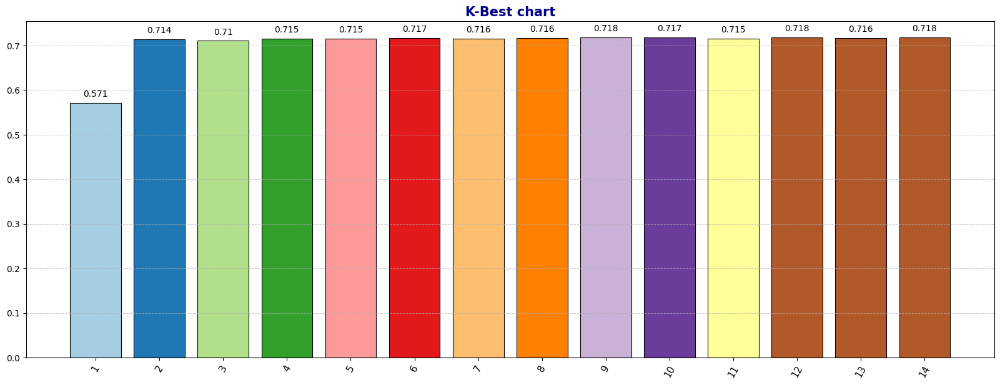

In [762]:
import numpy as np

x = np.arange(k_best-1)
width=0.4

plot_bar_chart(x, k_scores, 'K-Best chart')
plt.xticks(x, range(1,k_best));

In [763]:
# lets get the max variance value
max_value = max(k_scores)
max_index = k_scores.index(max_value) + 1

max_index

14

### Cluster analysis

<span style="color:yellow; font-size:17px;">KMeans Cluster</span>

In [785]:
xFeature_copy2 = xFeature

# prepare data for training
x_train_main, x_test, x_val, y_train_main, y_val, y_test = preprocess_data(xFeature_copy2, yTarget_cls)

In [786]:
# lets evelute the within cluster sum of square using 
# Simple, fast, and works well for spherical clusters.
from sklearn.cluster import KMeans

def calculate_wcss(init, x_train, n_clusters_range=(1, 10)):
    wcss = []
    for n in range(*n_clusters_range):
        kmeans = KMeans(n_clusters=n, init=init, random_state=10)
        kmeans.fit(x_train)
        wcss.append(kmeans.inertia_)
    return wcss

wcss_Kplus = calculate_wcss('k-means++', x_train_main)
wcss_rand = calculate_wcss('random', x_train_main)

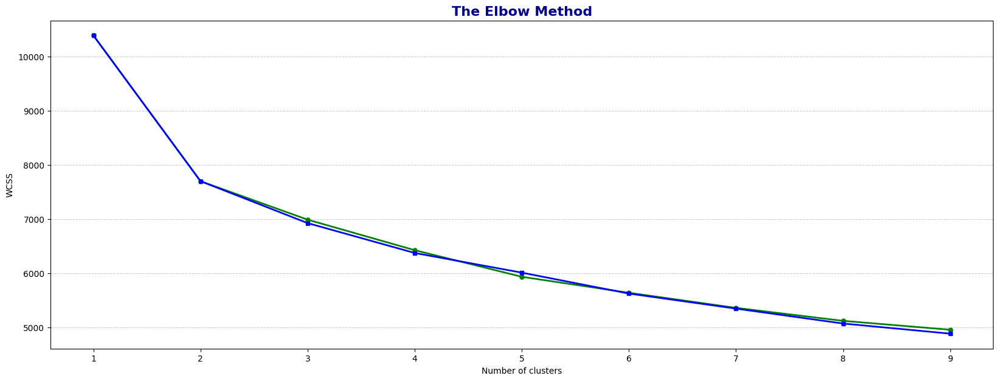

In [787]:
plot_line_graph(range(1, 10),  wcss_Kplus, 'o-g')
plot_line_graph(range(1, 10),  wcss_rand, 's-b', 'The Elbow Method', 'Number of clusters', 'WCSS')

In [788]:
# lets check if K = 2 is valid or not
clusters = KMeans(n_clusters=2,init='k-means++', random_state=10)
clusters.fit(x_train_main)

train_labels = clusters.predict(x_train_main)
test_labeles = clusters.predict(x_test)

In [789]:
# computing the silhouette and accuracy of out KMeans cluster classification
from sklearn.metrics import silhouette_score

kMeans_train_score = round(silhouette_score(x_train_main, train_labels), 2), round(accuracy_score(y_train_main, train_labels), 2)
kMeans_test_score = round(silhouette_score(x_test, test_labeles), 2), round(accuracy_score(y_test, test_labeles), 2)
kMeans_train_score, kMeans_test_score

((np.float64(0.25), 0.53), (np.float64(0.24), 0.54))

<span style="color:yellow; font-size:17px;">DBScan Cluster</span>

In [ ]:
from sklearn.cluster import DBSCAN

eps = [0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4]
min_samples = range(1, 5)

best_eps = None
best_min_samples = None
best_score = -1

for ep in eps:
    for sample in min_samples:
        dbscan = DBSCAN(eps=ep, min_samples=sample)
        clusters = dbscan.fit_predict(x_train_main)
        
        if len(np.unique(clusters)) > 1:
            score_value = round(silhouette_score(x_train_main, clusters), 2)

            if score_value > best_score:
                best_eps, best_min_samples, best_score = ep, sample, score_value

print(best_eps, best_min_samples, best_score)


# plt.figure(figsize=(8, 6))
# plt.scatter(X[:, 0], X[:, 1], c=clusters, cmap='viridis', s=50)
# plt.title('DBSCAN Clustering', fontsize=16, fontweight='bold')
# plt.xlabel('Feature 1', fontsize=12)
# plt.ylabel('Feature 2', fontsize=12)
# plt.grid(True)
# plt.show()

0.5 1 -0.26
0.5 2 -0.11
0.5 3 -0.03
0.5 4 0.04
0.6 1 -0.23
0.6 2 0.03
0.6 3 0.09
0.6 4 0.15
0.7 1 -0.06
0.7 2 0.25
0.7 3 0.25
0.7 4 0.25
0.8 1 0.08
0.8 2 0.27
0.8 3 0.27
0.8 4 0.27
0.9 1 0.23
0.9 2 0.29
0.9 3 0.29
0.9 4 0.29
1.0 1 0.27
1.0 2 0.27
1.0 3 0.27
1.0 4 0.27
0.9 2 0.29


<span style="color:yellow; font-size:17px;">Silhouette Analysis</span>

For n_clusters = 2, Silhouette Score = 0.221
For n_clusters = 3, Silhouette Score = 0.170
For n_clusters = 4, Silhouette Score = 0.158
For n_clusters = 5, Silhouette Score = 0.160
For n_clusters = 6, Silhouette Score = 0.157


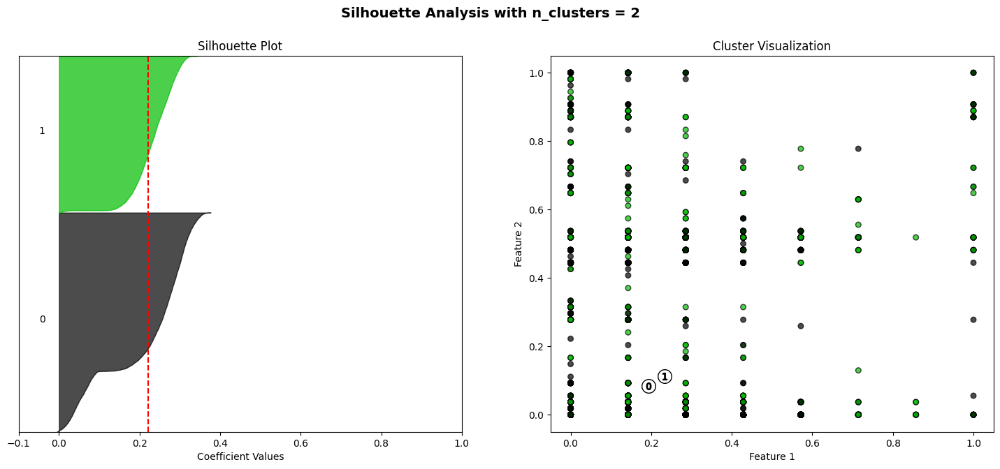

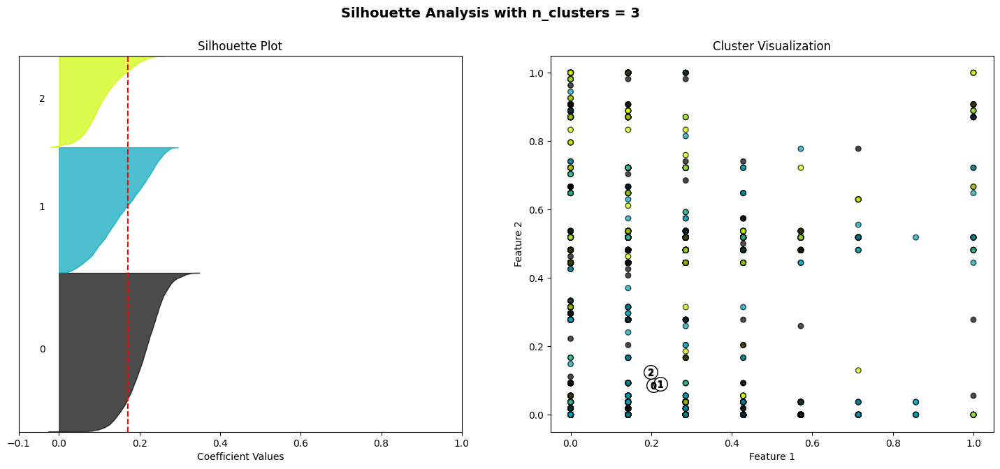

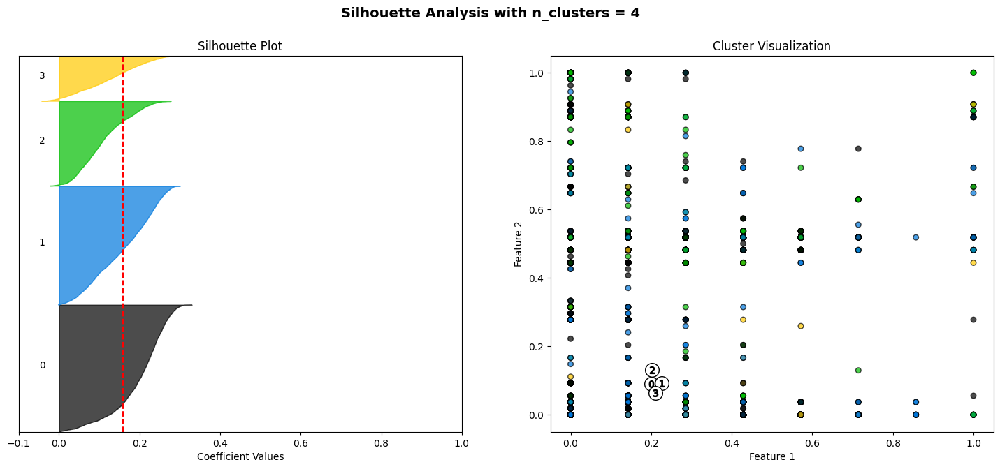

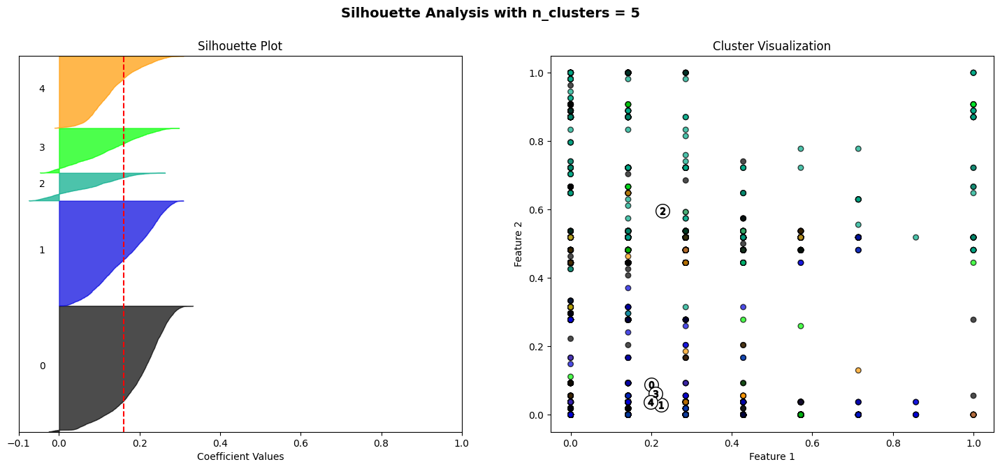

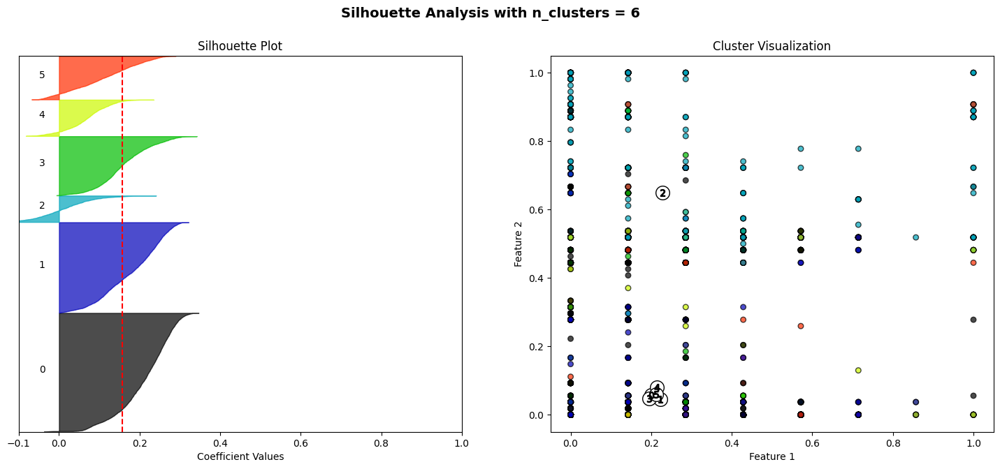

In [315]:
import matplotlib.cm as cm
from sklearn.metrics import silhouette_score, silhouette_samples

for clusters in range(2, 7):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))

    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(x_train_main) + (clusters + 1) * 10])

    model = KMeans(n_clusters=clusters, random_state=10)
    labels = model.fit_predict(x_train_main)

    avg_silhouette = silhouette_score(x_train_main, labels)
    print(f"For n_clusters = {clusters}, Silhouette Score = {avg_silhouette:.3f}")

    sample_scores = silhouette_samples(x_train_main, labels)
    y_lower = 10

    for i in range(clusters):
        cluster_scores = np.sort(sample_scores[labels == i])
        size = cluster_scores.shape[0]
        y_upper = y_lower + size

        color = cm.nipy_spectral(float(i) / clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper), 0, cluster_scores, facecolor=color, edgecolor=color, alpha=0.7
        )
        ax1.text(-0.05, y_lower + 0.5 * size, str(i))
        y_lower = y_upper + 10

    ax1.axvline(x=avg_silhouette, color="red", linestyle="--")
    ax1.set_title("Silhouette Plot")
    ax1.set_xlabel("Coefficient Values")
    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    colors = cm.nipy_spectral(labels.astype(float) / clusters)
    ax2.scatter(x_train_main[:, 0], x_train_main[:, 1], s=30, c=colors, alpha=0.7, edgecolor="k")

    centers = model.cluster_centers_
    ax2.scatter(centers[:, 0], centers[:, 1], c="white", s=200, edgecolor="k")

    for i, center in enumerate(centers):
        ax2.scatter(center[0], center[1], marker=f"${i}$", s=50, edgecolor="k")

    ax2.set_title("Cluster Visualization")
    ax2.set_xlabel("Feature 1")
    ax2.set_ylabel("Feature 2")

    plt.suptitle(f"Silhouette Analysis with n_clusters = {clusters}", fontsize=14, fontweight="bold")

plt.show()


###### We may conclude that the number of clusters or K values is 2 -> given that silhouette score is closer to 1

<span style="color:yellow; font-size:17px;">hierarchical Cluster</span>

In [612]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

agg_clustering = AgglomerativeClustering(n_clusters=2)
y_pred = agg_clustering.fit_predict(x_train_main)

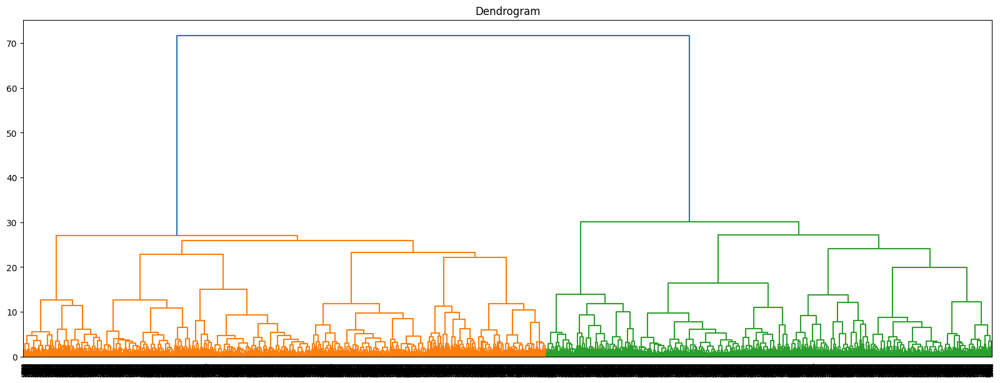

In [613]:
# Generate the linkage matrix
linkage = linkage(x_train_main, method='ward')

dendrogram(linkage)
plt.title('Dendrogram')
plt.show()

### Classification Problem

<span style="color:yellow; font-size:17px;">KNN</span>

In [72]:
from sklearn.neighbors import KNeighborsClassifier

def knn_model(weight = 'distance'):
    val_scores = []
    train_scores = []
    for k in range(1, 25):
        knn = KNeighborsClassifier(n_neighbors=k, weights=weight)
        knn = knn.fit(x_train_main, y_train_main)

        knn_pred = knn.predict(x_train_main)
        train_score = accuracy_score (y_train_main, knn_pred)
        train_scores.append(round(train_score, 3))

        knn_pred = knn.predict(x_val)
        val_score = accuracy_score (y_val , knn_pred)
        val_scores.append (round(val_score, 3))

    return train_scores, val_scores

knn_distance = knn_model(weight = 'distance')
knn_uniform = knn_model(weight = 'uniform')

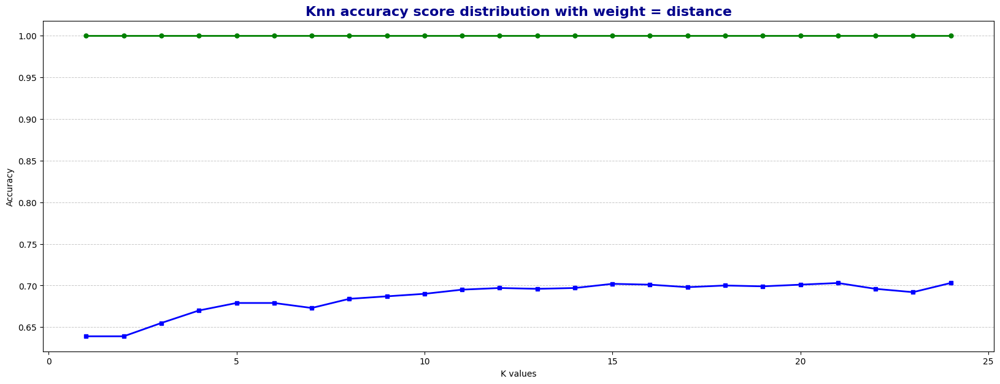

In [73]:
plot_line_graph(range(1, 25),  knn_distance[0], 'o-g')
plot_line_graph(range(1, 25),  knn_distance[1], 's-b', 'Knn accuracy score distribution with weight = distance', 'K values', 'Accuracy')

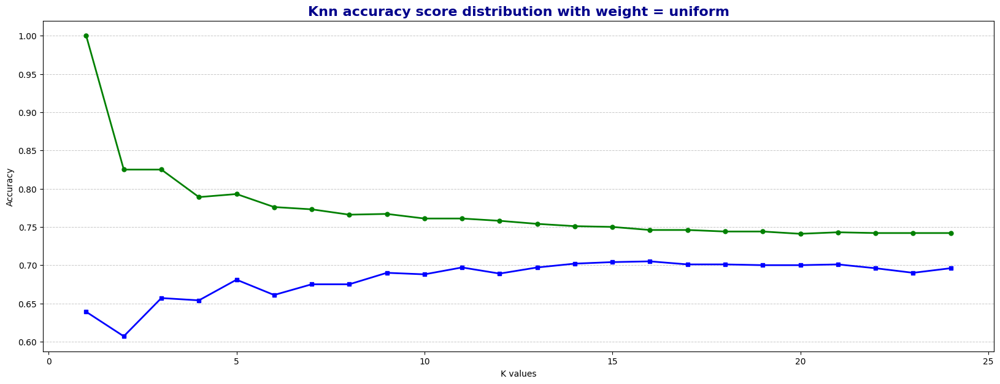

In [74]:
plot_line_graph(range(1, 25),  knn_uniform[0], 'o-g')
plot_line_graph(range(1, 25),  knn_uniform[1], 's-b', 'Knn accuracy score distribution with weight = uniform', 'K values', 'Accuracy')

In [ ]:
# Trying out grid search for K value
from sklearn.model_selection import GridSearchCV

knn_params = {
    'n_neighbors': range(1, 25),
    'weights': ['uniform', 'distance'],
    'metric': ['minkowski', 'euclidean', 'manhattan'],
    'p': [1, 2]
}

knn_search = GridSearchCV(KNeighborsClassifier(), knn_params, cv=4, n_jobs = -1)
knn_search.fit(x_train_main, y_train_main)

knn_search.best_params_

K best value: 24


<span style="color:yellow; font-size:17px;">LogisticRegression classification</span>

In [384]:
lgr_params = {
    'penalty': ['l1', 'l2', 'elasticnet'],
    'C': [0.01, 0.1, 1, 10],
    'solver': ['lbfgs', 'liblinear', 'sag', 'saga', 'newton-cg'],
    'max_iter': [100, 200, 300],
    'random_state': range(10, 30)
}

lgr_search = GridSearchCV(LogisticRegression(), lgr_params, cv = 4, n_jobs = -1)
lgr_search.fit(x_train_main, y_train_main)

lgr_search.best_params_

{'C': 0.1,
 'max_iter': 100,
 'penalty': 'l1',
 'random_state': 11,
 'solver': 'saga'}

<span style="color:yellow; font-size:17px;">SVM for classification</span>

In [383]:
from sklearn.svm import SVC

svc_params = {
    'C': [0.1, 1, 10],
    'gamma': [0.001, 0.01, 0.1, 1],
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid']
}

svc_search = GridSearchCV(SVC(), svc_params, cv=4, n_jobs=-1)
svc_search.fit(x_train_main, y_train_main)

svc_search.best_params_

{'C': 1, 'gamma': 1, 'kernel': 'rbf'}

<span style="color:yellow; font-size:17px;">XGBoost</span>

In [382]:
# !pip install xgboost
from xgboost import XGBClassifier

xgboost_params = {
    'max_depth': [3, 6, 10],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [50, 100, 200]
}

xgboost_search = GridSearchCV(XGBClassifier(), xgboost_params, cv=4, n_jobs=-1)
xgboost_search.fit(x_train_main, y_train_main)

xgboost_search.best_params_

{'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200}

<span style="color:yellow; font-size:17px;">Decision Tree</span>

In [76]:
from sklearn.tree import DecisionTreeClassifier

clf_val = []
clf_train = []

for st in range(1, 25):
    clf = DecisionTreeClassifier(random_state=st)

    clf = clf.fit(X=x_train_main, y=y_train_main)
    
    clf_pred = clf.predict(x_train_main)
    clf_score = accuracy_score(y_train_main, clf_pred)
    clf_train.append(clf_score)

    clf_pred = clf.predict(x_val)
    clf_score = accuracy_score(y_val, clf_pred)
    clf_val.append(clf_score)

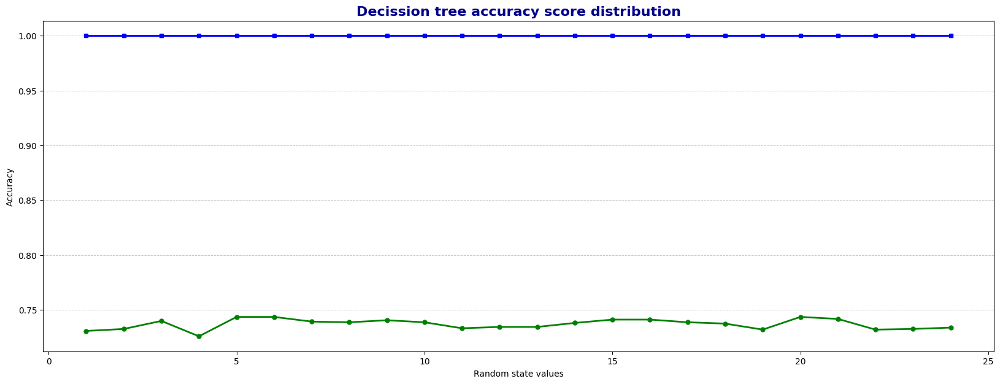

In [77]:
plot_line_graph(range(1, 25),  clf_val, 'o-g')
plot_line_graph(range(1, 25),  clf_train, 's-b', 'Decission tree accuracy score distribution', 'Random state values', 'Accuracy')

In [79]:
# lets get the max random state value
max_value = max(clf_val)
random_state = clf_val.index(max_value) + 1

random_state

5

In [381]:
clf_params = {
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10]
}
clf = DecisionTreeClassifier(random_state = 5)

clf_search = GridSearchCV(clf, clf_params, cv=4, n_jobs=-1)
clf_search.fit(x_train_main, y_train_main)

clf_search.best_params_

{'criterion': 'gini', 'max_depth': 10, 'min_samples_split': 10}

In [ ]:
# from sklearn import tree

# tree.plot_tree(clf);

<span style="color:yellow; font-size:17px;">RandomForestClassifier</span>

In [805]:
rfs_params = {
    'n_estimators': [50, 100, 200],     
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4], 
    'max_features': ['sqrt', 'log2'],
    'bootstrap': [True, False]
}


rfs = RandomForestClassifier(random_state=47)

rfs_search = GridSearchCV(rfs, rfs_params, cv=4, n_jobs=-1)
rfs_search.fit(x_train_main, y_train_main)

rfs_search.best_params_

{'bootstrap': True,
 'max_depth': 30,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 10,
 'n_estimators': 200}

### Classification problem data modeling

In [824]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score,roc_auc_score

cls_models = {
    'LogisticRegression': LogisticRegression(C = 0.1, max_iter = 100, penalty = 'l1', random_state = 11, solver = 'saga'),
    'Decision Tree Classifier': DecisionTreeClassifier(random_state = 5, criterion = 'gini', max_depth = 10, min_samples_split = 10),
    'K-Nearest Neighbors': KNeighborsClassifier(metric = 'minkowski', n_neighbors = 23, p = 1, weights = 'distance'),
    'SVC': SVC(C = 1, gamma = 1, kernel = 'rbf'),
    
    # esemble learning models
    'Random Forest': RandomForestClassifier(n_estimators=200, random_state = 47, min_samples_leaf = 1), # increase in min_samples_split < accuracy 
    # 'Random Forest': RandomForestClassifier(random_state = 47, bootstrap = True, max_depth = 30, max_features = 'sqrt', min_samples_leaf = 1, min_samples_split = 10, n_estimators = 200),
    'XGBoost': XGBClassifier(learning_rate = 0.2, max_depth = 3, n_estimators = 200) # learning_rate = 0.1, max_depth = 2, n_estimators = 400
}


train_results = []
test_results = []

for name, model in cls_models.items():
    model.fit(x_train_main, y_train_main)  

    train_pred = model.predict(x_train_main)
    test_pred = model.predict(x_test)
    
    confusion_train = confusion_matrix(y_train_main, train_pred)
    accuracy_train = round(accuracy_score(y_train_main, train_pred) * 100, 2)
    precision_train = round(precision_score(y_train_main, train_pred) * 100, 2)
    recall_train = round(recall_score(y_train_main, train_pred) * 100, 2)
    f1_train = round(f1_score(y_train_main, train_pred) * 100, 2)
    roc_train = round(roc_auc_score(y_train_main, train_pred) * 100, 2)

    confusion_test = confusion_matrix(y_test, test_pred)
    accuracy_test = round(accuracy_score(y_test, test_pred) * 100, 2)
    precision_test = round(precision_score(y_test, test_pred) * 100, 2)
    recall_test = round(recall_score(y_test, test_pred) * 100, 2)
    f1_test = round(f1_score(y_test, test_pred) * 100, 2)
    roc_test = round(roc_auc_score(y_test, test_pred) * 100, 2)

    train_results.append({
        'Model': name,
        'Confusion': confusion_train,
        'Accuracy Score': f"{accuracy_train}%",
        'Precision': f"{precision_train}%",
        'Recall': f"{recall_train}%",
        'F1 Score': f"{f1_train}%",
        'ROC-AUC': f"{roc_train}%",
        'Predictions': train_pred
    })

    test_results.append({
        'Model': name,
        'Confusion': confusion_test,
        'Accuracy Score': f"{accuracy_test}%",
        'Precision': f"{precision_test}%",
        'Recall': f"{recall_test}%",
        'F1 Score': f"{f1_test}%",
        'ROC-AUC': f"{roc_test}%",
        'Predictions': test_pred
    })

In [823]:
# Train dataset result table  
pd.DataFrame(train_results)

,Model,Confusion,Accuracy Score,Precision,Recall,F1 Score,ROC-AUC,Predictions
0,LogisticRegression,"[[3762, 2388], [1763, 6850]]",71.88%,74.15%,79.53%,76.75%,70.35%,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, ..."
1,Decision Tree Classifier,"[[4815, 1335], [1102, 7511]]",83.49%,84.91%,87.21%,86.04%,82.75%,"[1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, ..."
2,K-Nearest Neighbors,"[[6150, 0], [0, 8613]]",100.0%,100.0%,100.0%,100.0%,100.0%,"[1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, ..."
3,SVC,"[[3787, 2363], [1314, 7299]]",75.09%,75.54%,84.74%,79.88%,73.16%,"[1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, ..."
4,Random Forest,"[[6150, 0], [0, 8613]]",100.0%,100.0%,100.0%,100.0%,100.0%,"[1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, ..."
5,XGBoost,"[[5048, 1102], [1010, 7603]]",85.69%,87.34%,88.27%,87.8%,85.18%,"[1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, ..."


In [807]:
# Train dataset result table  
pd.DataFrame(train_results)

,Model,Confusion,Accuracy Score,Precision,Recall,F1 Score,ROC-AUC,Predictions
0,LogisticRegression,"[[3762, 2388], [1763, 6850]]",71.88%,74.15%,79.53%,76.75%,70.35%,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, ..."
1,Decision Tree Classifier,"[[4815, 1335], [1102, 7511]]",83.49%,84.91%,87.21%,86.04%,82.75%,"[1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, ..."
2,K-Nearest Neighbors,"[[6150, 0], [0, 8613]]",100.0%,100.0%,100.0%,100.0%,100.0%,"[1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, ..."
3,SVC,"[[3787, 2363], [1314, 7299]]",75.09%,75.54%,84.74%,79.88%,73.16%,"[1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, ..."
4,Random Forest,"[[5762, 388], [318, 8295]]",95.22%,95.53%,96.31%,95.92%,95.0%,"[1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, ..."
5,XGBoost,"[[5048, 1102], [1010, 7603]]",85.69%,87.34%,88.27%,87.8%,85.18%,"[1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, ..."


In [801]:
# Train dataset result table  
pd.DataFrame(train_results) 

,Model,Confusion,Accuracy Score,Precision,Recall,F1 Score,ROC-AUC,Predictions
0,LogisticRegression,"[[3762, 2388], [1763, 6850]]",71.88%,74.15%,79.53%,76.75%,70.35%,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, ..."
1,Decision Tree Classifier,"[[4815, 1335], [1102, 7511]]",83.49%,84.91%,87.21%,86.04%,82.75%,"[1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, ..."
2,K-Nearest Neighbors,"[[6150, 0], [0, 8613]]",100.0%,100.0%,100.0%,100.0%,100.0%,"[1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, ..."
3,Random Forest,"[[6150, 0], [0, 8613]]",100.0%,100.0%,100.0%,100.0%,100.0%,"[1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, ..."
4,XGBoost,"[[5048, 1102], [1010, 7603]]",85.69%,87.34%,88.27%,87.8%,85.18%,"[1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, ..."
5,SVC,"[[3787, 2363], [1314, 7299]]",75.09%,75.54%,84.74%,79.88%,73.16%,"[1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, ..."


In [808]:
# Train dataset result table  
pd.DataFrame(test_results) 

,Model,Confusion,Accuracy Score,Precision,Recall,F1 Score,ROC-AUC,Predictions
0,LogisticRegression,"[[1818, 1151], [826, 3236]]",71.88%,73.76%,79.67%,76.6%,70.45%,"[0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, ..."
1,Decision Tree Classifier,"[[2190, 779], [672, 3390]]",79.36%,81.31%,83.46%,82.37%,78.61%,"[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, ..."
2,K-Nearest Neighbors,"[[1836, 1133], [616, 3446]]",75.12%,75.26%,84.84%,79.76%,73.34%,"[1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, ..."
3,SVC,"[[1831, 1138], [594, 3468]]",75.37%,75.29%,85.38%,80.02%,73.52%,"[0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, ..."
4,Random Forest,"[[2110, 859], [604, 3458]]",79.19%,80.1%,85.13%,82.54%,78.1%,"[1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, ..."
5,XGBoost,"[[2369, 600], [557, 3505]]",83.54%,85.38%,86.29%,85.83%,83.04%,"[1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, ..."


In [802]:
# Train dataset result table  
pd.DataFrame(test_results) 

,Model,Confusion,Accuracy Score,Precision,Recall,F1 Score,ROC-AUC,Predictions
0,LogisticRegression,"[[1818, 1151], [826, 3236]]",71.88%,73.76%,79.67%,76.6%,70.45%,"[0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, ..."
1,Decision Tree Classifier,"[[2190, 779], [672, 3390]]",79.36%,81.31%,83.46%,82.37%,78.61%,"[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, ..."
2,K-Nearest Neighbors,"[[1836, 1133], [616, 3446]]",75.12%,75.26%,84.84%,79.76%,73.34%,"[1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, ..."
3,Random Forest,"[[2135, 834], [590, 3472]]",79.75%,80.63%,85.48%,82.98%,78.69%,"[1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, ..."
4,XGBoost,"[[2369, 600], [557, 3505]]",83.54%,85.38%,86.29%,85.83%,83.04%,"[1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, ..."
5,SVC,"[[1831, 1138], [594, 3468]]",75.37%,75.29%,85.38%,80.02%,73.52%,"[0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, ..."


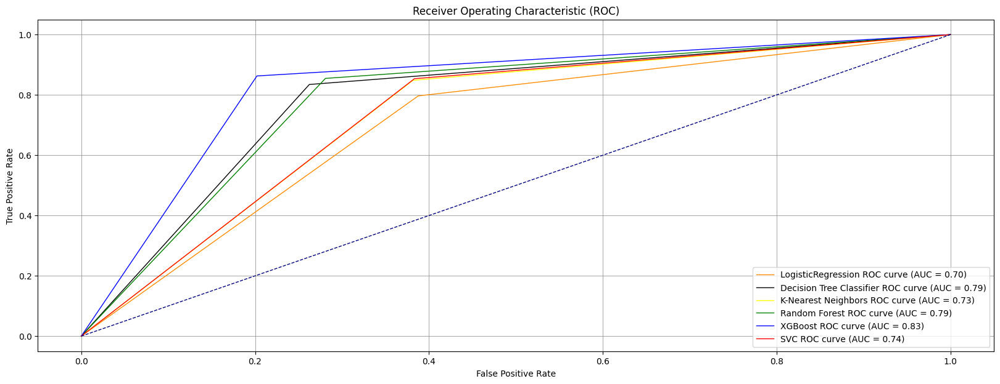

In [792]:
from sklearn.metrics import roc_curve, auc
colors = ['darkorange', 'black', 'yellow', 'green', 'blue', 'red']

for index in range(len(test_results)):
    fpr, tpr, thresholds = roc_curve(y_test, test_results[index]['Predictions'])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color=colors[index], lw=1, label=f'{test_results[index]["Model"]} ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.grid(which='major', color='grey', linestyle='-', linewidth=0.5)
plt.legend(loc='lower right');


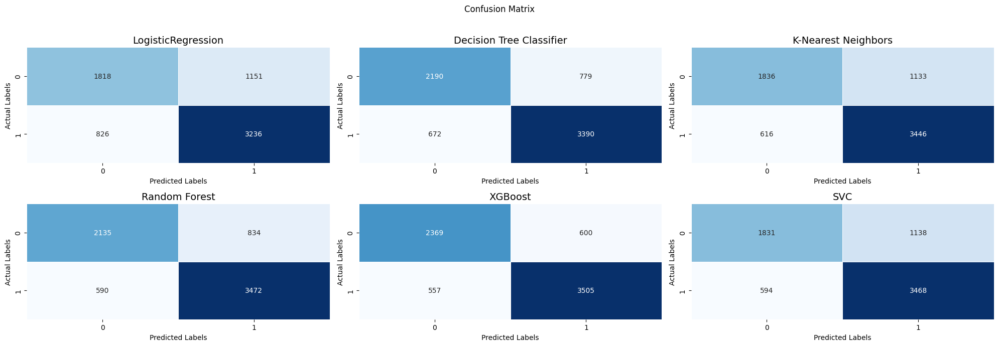

In [793]:
# Create subplots with 2 rows and 3 columns
fig, axes = plt.subplots(2, 3)
ax1, ax2, ax3, ax4, ax5, ax6 = axes.flatten()
axes_list = [ax1, ax2, ax3, ax4, ax5, ax6]

fig.suptitle('Confusion Matrix')

for index in range(len(test_results)):
    sns.heatmap(test_results[index]['Confusion'], annot=True, fmt='d', cmap='Blues', linewidths=.5, cbar=False, ax=axes_list[index])
    axes_list[index].set_xlabel('Predicted Labels')
    axes_list[index].set_ylabel('Actual Labels')  
    axes_list[index].set_title(test_results[index]['Model'], fontsize=14)     

plt.tight_layout(rect=[0, 0, 1, 0.96])

### Regression Problem -> Linear regrtession

In [352]:
x1_train, x1_test, y1_train, y1_test = preprocess_data(x=xFeature, y=yTarget_reg, classificaion=False)

<span style="color:yellow; font-size:17px;">XGBRegressor</span>

In [380]:
from xgboost import XGBRegressor

xg_params = {
    'n_estimators': [100, 200, 300, 400],
    'max_depth': [3, 5, 7, 10],
    'learning_rate': [0.01, 0.1, 0.2],
}

xg_search = GridSearchCV(XGBRegressor(), xg_params, cv=4, scoring='neg_mean_squared_error', n_jobs=-1)
xg_search.fit(x1_train, y1_train)

xg_search.best_params_

{'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 300}

<span style="color:yellow; font-size:17px;">DecisionTreeRegressor</span>

In [379]:
from sklearn.tree import DecisionTreeRegressor

dtr_params = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['squared_error', 'friedman_mse', 'absolute_error']
}

dtr = DecisionTreeRegressor(random_state=42)
dtr_search = GridSearchCV(dtr, dtr_params, cv=4, scoring='neg_mean_squared_error', n_jobs=-1)
dtr_search.fit(x1_train, y1_train)

dtr_search.best_params_

{'criterion': 'absolute_error',
 'max_depth': 10,
 'min_samples_leaf': 4,
 'min_samples_split': 10}

<span style="color:yellow; font-size:17px;">RandomForestRegressor</span>

In [378]:
from sklearn.ensemble import RandomForestRegressor

df_params = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf = RandomForestRegressor(random_state=42)
rf_search = GridSearchCV(rf, df_params,  cv=4, scoring='neg_mean_squared_error', n_jobs=-1)
rf_search.fit(x1_train, y1_train)

rf_search.best_params_

{'max_depth': 30,
 'min_samples_leaf': 4,
 'min_samples_split': 10,
 'n_estimators': 300}

<span style="color:yellow; font-size:17px;">SVR</span>

In [376]:
from sklearn.svm import SVR

svr_params = {
    'kernel': ['linear', 'rbf', 'poly'],
    'C': [0.1, 1, 10, 100],
    'epsilon': [0.1, 0.5, 1],
    'gamma': ['scale', 'auto']
}

svr_search = GridSearchCV(SVR(), param_grid=svr_params, scoring='neg_mean_squared_error', cv=5, n_jobs=-1)
svr_search.fit(x1_train, y1_train)

svr_search.best_params_

{'C': 100, 'epsilon': 1, 'gamma': 'scale', 'kernel': 'poly'}

<span style="color:yellow; font-size:17px;">GradientBoostingRegressor</span>

In [377]:
from sklearn.ensemble import GradientBoostingRegressor

gbr_params = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 5, 10],
    'subsample': [0.7, 0.85, 1.0]
}

gbr = GradientBoostingRegressor(random_state=42)

gbr_search = GridSearchCV(gbr, gbr_params, scoring='neg_mean_squared_error', cv=5, n_jobs=-1)
gbr_search.fit(x1_train, y1_train)

gbr_search.best_params_

{'learning_rate': 0.01,
 'max_depth': 3,
 'min_samples_leaf': 10,
 'min_samples_split': 2,
 'n_estimators': 200,
 'subsample': 1.0}

In [798]:
from sklearn.metrics import r2_score, mean_squared_error, root_mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

reg_models = {
    'Random Forest Regressor': RandomForestRegressor(max_depth = 30, min_samples_leaf = 4, min_samples_split = 10, n_estimators = 300),
    'Decision Tree Regressor': DecisionTreeRegressor(random_state = 42, criterion = 'absolute_error',min_samples_leaf = 4, max_depth = 10, min_samples_split = 10),
    'XGB Regressor': XGBRegressor(learning_rate = 0.01, max_depth = 3, n_estimators = 300),
    'SVR': SVR(C = 100, gamma = 'scale', kernel = 'poly', epsilon = 1),
    'Gradient Boosting Regressor': GradientBoostingRegressor(learning_rate = 0.01, max_depth = 3, min_samples_leaf = 10, min_samples_split = 2, n_estimators = 200, subsample = 1.0)
}


train_results2 = []
test_results2 = []

for name, model in reg_models.items():
    model.fit(x1_train, y1_train)  

    train_pred = model.predict(x1_train)
    test_pred = model.predict(x1_test)
    
    mae_train = round(mean_absolute_error(y1_train, train_pred), 2)
    mse_train = round(mean_squared_error(y1_train, train_pred), 2)
    rmse_train = round(root_mean_squared_error(y1_train, train_pred), 2)
    r2_train = round(r2_score(y1_train, train_pred), 2)
    mape_train = round(mean_absolute_percentage_error(y1_train, train_pred), 2)

    mae_test = round(mean_absolute_error(y1_test, test_pred), 2)
    mse_test = round(mean_squared_error(y1_test, test_pred), 2)
    rmse_test = round(root_mean_squared_error(y1_test, test_pred), 2)
    r2_test = round(r2_score(y1_test, test_pred) * 100, 2)
    mape_test = round(mean_absolute_percentage_error(y1_test, test_pred), 2)

    train_results.append({
        'Model': name,
        'MAE': int(mae_train),
        'MSE': mse_train,
        'RMSE': rmse_train,
        'R-squared': f"{r2_train}",
        'MAPE': mape_train,
        'Predictions': train_pred
    })

    test_results.append({
        'Model': name,
        'MAE': int(mae_test),
        'MSE': mse_test,
        'RMSE': rmse_test,
        'R-squared': f"{r2_test}%",
        'MAPE': mape_test,
        'Predictions': test_pred
    })
